In [1]:
pip install anndata

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [1]:
pip install scanpy 

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [50]:
pip install loompy

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 KB 1.2 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 KB 6.8 MB/s eta 0:00:00
  Created wheel for loompy: filename=loompy-3.0.8-py3-none-any.whl size=54013 sha256=f73a28a6704983cb362f5873e7e4d3f169064098b97d3ef46968b7c7eb44279c
  Stored in directory: /Users/marianavasques/.cache/pip/wheels/85/bd/f4/25b77f84a3422e43793b60935a51cdff79072b7682d1dd6d79
Successfully built loompy
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
Note: you may need to restart the kernel to use updated packages.


In [68]:
pip install bbknn

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 647.5/647.5 KB 17.5 MB/s eta 0:00:0000:01
  Preparing metadata (setup.py) ... done
  Created wheel for annoy: filename=annoy-1.17.3-cp310-cp310-linux_x86_64.whl size=550479 sha256=0fbf3d3a96cb3685f1b75b5ed0f10bddf4e7d030c8b06eb217e0a892bb35b935
  Stored in directory: /Users/marianavasques/.cache/pip/wheels/64/8a/da/f714bcf46c5efdcfcac0559e63370c21abe961c48e3992465a
Successfully built annoy
Note: you may need to restart the kernel to use updated packages.


In [55]:
pip install igraph

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 48.4 MB/s eta 0:00:00a 0:00:01
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
Note: you may need to restart the kernel to use updated packages.


In [9]:
pip install leidenalg

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 35.4 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [7]:
pip install seaborn

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [1]:
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import loompy as lp
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
adata  = sc.read("analysis/integration/anndata_annot.h5ad")

In [3]:
adata

AnnData object with n_obs × n_vars = 21255 × 33262
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'experiment', 'day', 'cell_type', 'S.Score', 'G2M.Score', 'Phase', 'SNN_harmony20_res.0.2', 'SNN_harmony20_res.0.3', 'SNN_harmony20_res.0.4', 'SNN_harmony20_res.0.5', 'SNN_harmony20_res.0.6', 'SNN_harmony20_res.0.7', 'SNN_harmony20_res.0.8', 'SNN_harmony20_res.0.9', 'SNN_harmony20_res.1', 'seurat_clusters', 'sample_type', 'D104T11_annotation', 'leiden_res_0.1', 'leiden_res_0.2', 'leiden_res_0.3', 'leiden_res_0.4', 'leiden_res_0.5', 'leiden_res_0.6', 'leiden_res_0.7', 'leiden_res_0.8', 'leiden_res_0.9', 'leiden_res_1.0', 'bbknn_annotation'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Phase_colors', 'SNN_harmony20_res.0.3_colors', 'SNN_harmony20_res.0.4_colors', 'SNN_harmony20_res.0.5_colors', 'SNN_harmony20_res.0.6_colors', 'bbknn_annotation_colors', 'cell_type_colors', 'day_colors', 'dendrogram_leiden_res_

In [3]:
import os
cwd = os.getcwd()

In [4]:
cwd

'/Users/marianavasques'

In [2]:
def create_anndata(path):
    counts = sc.read_mtx(path + "integration_counts.mtx").transpose()
    meta = pd.read_csv(path + "harmony_metadata.csv", index_col=0)
    features = pd.read_csv(path +"gene_names.csv", index_col=0)
    
    adata = ad.AnnData(counts)
    adata.obs_names = meta.index.values.tolist()
    adata.var_names = features.index.values.tolist()
    adata.obs = meta
    
    return adata
    

In [48]:
adata = create_anndata("analysis/integration/")

In [49]:
adata

AnnData object with n_obs × n_vars = 21255 × 33262
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'experiment', 'day', 'cell_type', 'S.Score', 'G2M.Score', 'Phase', 'SNN_harmony20_res.0.2', 'SNN_harmony20_res.0.3', 'SNN_harmony20_res.0.4', 'SNN_harmony20_res.0.5', 'SNN_harmony20_res.0.6', 'SNN_harmony20_res.0.7', 'SNN_harmony20_res.0.8', 'SNN_harmony20_res.0.9', 'SNN_harmony20_res.1', 'seurat_clusters', 'sample_type', 'D104T11_annotation'

In [6]:
adata.X

<21255x33262 sparse matrix of type '<class 'numpy.float32'>'
	with 38842689 stored elements in Compressed Sparse Column format>

In [8]:
np.array(adata.var_names)

array(['Xkr4', 'Gm1992', 'Gm37381', ..., 'Ccl27a.1', '4933409K07Rik',
       'Ccl27a.2'], dtype=object)

In [9]:
np.array(adata.obs_names)

array(['D104T11_AAACCTGAGATATGCA-1', 'D104T11_AAACCTGCAAACCCAT-1',
       'D104T11_AAACCTGCACAGAGGT-1', ...,
       'hCD2_d11_Tfr_TTTCACATCCCTAGGG-1',
       'hCD2_d11_Tfr_TTTGGAGGTCGAGCTC-1',
       'hCD2_d11_Tfr_TTTGTTGTCCACACCT-1'], dtype=object)

In [10]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.rb,experiment,day,cell_type,S.Score,G2M.Score,...,SNN_harmony20_res.0.4,SNN_harmony20_res.0.5,SNN_harmony20_res.0.6,SNN_harmony20_res.0.7,SNN_harmony20_res.0.8,SNN_harmony20_res.0.9,SNN_harmony20_res.1,seurat_clusters,sample_type,D104T11_annotation
D104T11_AAACCTGAGATATGCA-1,D104T11,12381,3205,2.350376,24.957596,GFP,6,Tfh,-0.072437,-0.106463,...,3,3,3,2,2,4,4,4,d6_Mix(Treg+Tfh),Tfh
D104T11_AAACCTGCAAACCCAT-1,D104T11,9495,2650,2.338073,23.317536,GFP,6,Treg,-0.152785,-0.122366,...,0,4,5,4,5,2,2,2,d6_Mix(Treg+Tfh),Treg
D104T11_AAACCTGCACAGAGGT-1,D104T11,1506,719,10.424967,26.826029,GFP,6,Treg,-0.095364,-0.062304,...,0,4,5,4,5,2,2,2,d6_Mix(Treg+Tfh),Treg
D104T11_AAACCTGCAGGTTTCA-1,D104T11,9840,2443,2.317073,33.810976,GFP,6,Treg,-0.088444,-0.170569,...,6,7,7,8,8,9,8,8,d6_Mix(Treg+Tfh),Treg
D104T11_AAACCTGCATCCCACT-1,D104T11,6131,2152,1.223291,23.894960,GFP,6,Treg,-0.020903,-0.055677,...,0,4,5,4,5,2,2,2,d6_Mix(Treg+Tfh),Treg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hCD2_d11_Tfr_TTTACCATCGAAGCCC-1,hCD2_d11_Tfr,9730,2825,3.586845,28.273381,hCD2,11,Tfr,-0.129511,-0.009163,...,0,1,1,1,1,6,5,5,d11_Tfr,NaN
hCD2_d11_Tfr_TTTACTGCACTCGATA-1,hCD2_d11_Tfr,21302,3988,2.295559,29.931462,hCD2,11,Tfr,-0.144996,-0.083544,...,0,4,5,4,5,2,2,2,d11_Tfr,NaN
hCD2_d11_Tfr_TTTCACATCCCTAGGG-1,hCD2_d11_Tfr,15856,3275,5.127397,32.359990,hCD2,11,Tfr,-0.157214,-0.046783,...,3,3,3,2,2,4,4,4,d11_Tfr,NaN
hCD2_d11_Tfr_TTTGGAGGTCGAGCTC-1,hCD2_d11_Tfr,7294,2538,3.125857,21.044694,hCD2,11,Tfr,-0.137308,-0.070648,...,0,1,1,1,1,6,5,5,d11_Tfr,NaN


In [9]:
row_attrs = {
    "Gene": np.array(adata.var_names) ,
}
col_attrs = {
    "CellID": np.array(adata.obs_names) ,
    "nGene": np.array(np.sum(adata.X.transpose()>0, axis=0)).flatten() ,
    "nUMI": np.array(np.sum(adata.X.transpose(), axis=0)).flatten() ,
}

lp.create("analysis/pyscenic/integration_counts_scenic.loom", adata.X.transpose(), row_attrs, col_attrs)

In [50]:
adata.layers["counts"] = adata.X.copy()

In [51]:
adata

AnnData object with n_obs × n_vars = 21255 × 33262
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'experiment', 'day', 'cell_type', 'S.Score', 'G2M.Score', 'Phase', 'SNN_harmony20_res.0.2', 'SNN_harmony20_res.0.3', 'SNN_harmony20_res.0.4', 'SNN_harmony20_res.0.5', 'SNN_harmony20_res.0.6', 'SNN_harmony20_res.0.7', 'SNN_harmony20_res.0.8', 'SNN_harmony20_res.0.9', 'SNN_harmony20_res.1', 'seurat_clusters', 'sample_type', 'D104T11_annotation'
    layers: 'counts'

In [52]:
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)

In [53]:
adata.layers["data"] = adata.X.copy()

In [54]:
adata

AnnData object with n_obs × n_vars = 21255 × 33262
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'experiment', 'day', 'cell_type', 'S.Score', 'G2M.Score', 'Phase', 'SNN_harmony20_res.0.2', 'SNN_harmony20_res.0.3', 'SNN_harmony20_res.0.4', 'SNN_harmony20_res.0.5', 'SNN_harmony20_res.0.6', 'SNN_harmony20_res.0.7', 'SNN_harmony20_res.0.8', 'SNN_harmony20_res.0.9', 'SNN_harmony20_res.1', 'seurat_clusters', 'sample_type', 'D104T11_annotation'
    uns: 'log1p'
    layers: 'counts', 'data'

In [50]:
pip install --user scikit-misc

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.8/188.8 KB 3.9 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


In [55]:
sc.pp.highly_variable_genes(adata, n_top_genes=5000)

In [51]:
#sc.pp.highly_variable_genes(adata, n_top_genes=5000, flavor="seurat_v3", layer="counts")

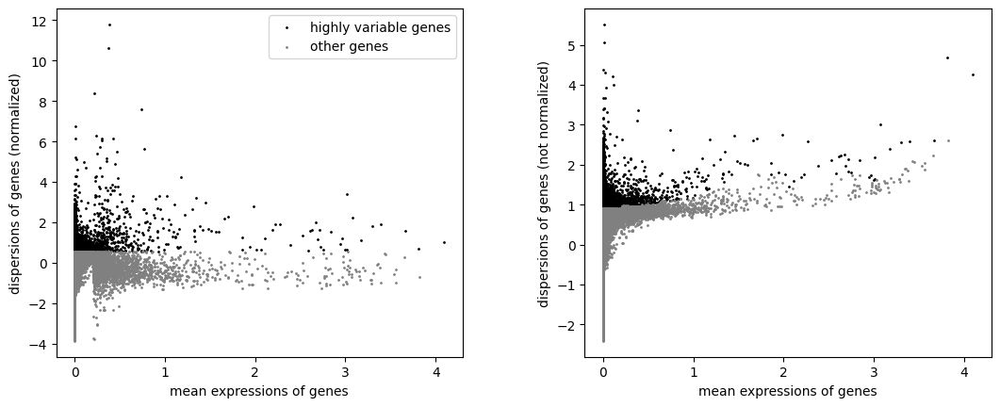

In [56]:
sc.pl.highly_variable_genes(adata)

In [57]:
sc.pp.regress_out(adata, keys=["nCount_RNA","nFeature_RNA","percent.rb","percent.mt"])
sc.pp.scale(adata)

In [58]:
adata.layers["scale_data"] = adata.X.copy()

In [59]:
adata

AnnData object with n_obs × n_vars = 21255 × 33262
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'experiment', 'day', 'cell_type', 'S.Score', 'G2M.Score', 'Phase', 'SNN_harmony20_res.0.2', 'SNN_harmony20_res.0.3', 'SNN_harmony20_res.0.4', 'SNN_harmony20_res.0.5', 'SNN_harmony20_res.0.6', 'SNN_harmony20_res.0.7', 'SNN_harmony20_res.0.8', 'SNN_harmony20_res.0.9', 'SNN_harmony20_res.1', 'seurat_clusters', 'sample_type', 'D104T11_annotation'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg'
    layers: 'counts', 'data', 'scale_data'

In [60]:
sc.pp.pca(adata, n_comps=50, mask_var="highly_variable")

In [61]:
adata

AnnData object with n_obs × n_vars = 21255 × 33262
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'experiment', 'day', 'cell_type', 'S.Score', 'G2M.Score', 'Phase', 'SNN_harmony20_res.0.2', 'SNN_harmony20_res.0.3', 'SNN_harmony20_res.0.4', 'SNN_harmony20_res.0.5', 'SNN_harmony20_res.0.6', 'SNN_harmony20_res.0.7', 'SNN_harmony20_res.0.8', 'SNN_harmony20_res.0.9', 'SNN_harmony20_res.1', 'seurat_clusters', 'sample_type', 'D104T11_annotation'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts', 'data', 'scale_data'

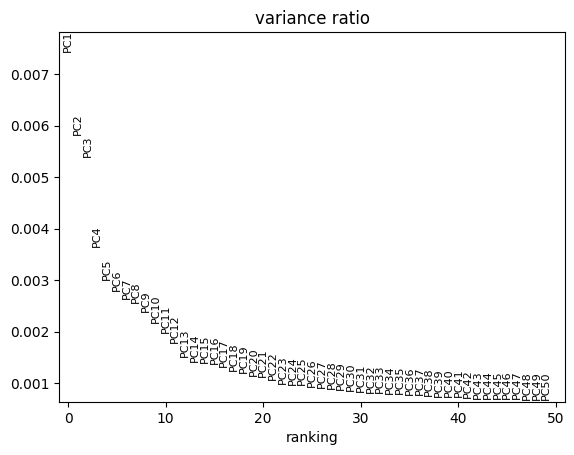

In [62]:
sc.pl.pca_variance_ratio(adata, n_pcs=50)

In [63]:
sc.external.pp.bbknn(adata, batch_key="experiment", use_rep="X_pca", n_pcs=25)

In [64]:
sc.tl.umap(adata)

In [65]:
adata

AnnData object with n_obs × n_vars = 21255 × 33262
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'experiment', 'day', 'cell_type', 'S.Score', 'G2M.Score', 'Phase', 'SNN_harmony20_res.0.2', 'SNN_harmony20_res.0.3', 'SNN_harmony20_res.0.4', 'SNN_harmony20_res.0.5', 'SNN_harmony20_res.0.6', 'SNN_harmony20_res.0.7', 'SNN_harmony20_res.0.8', 'SNN_harmony20_res.0.9', 'SNN_harmony20_res.1', 'seurat_clusters', 'sample_type', 'D104T11_annotation'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'data', 'scale_data'
    obsp: 'distances', 'connectivities'

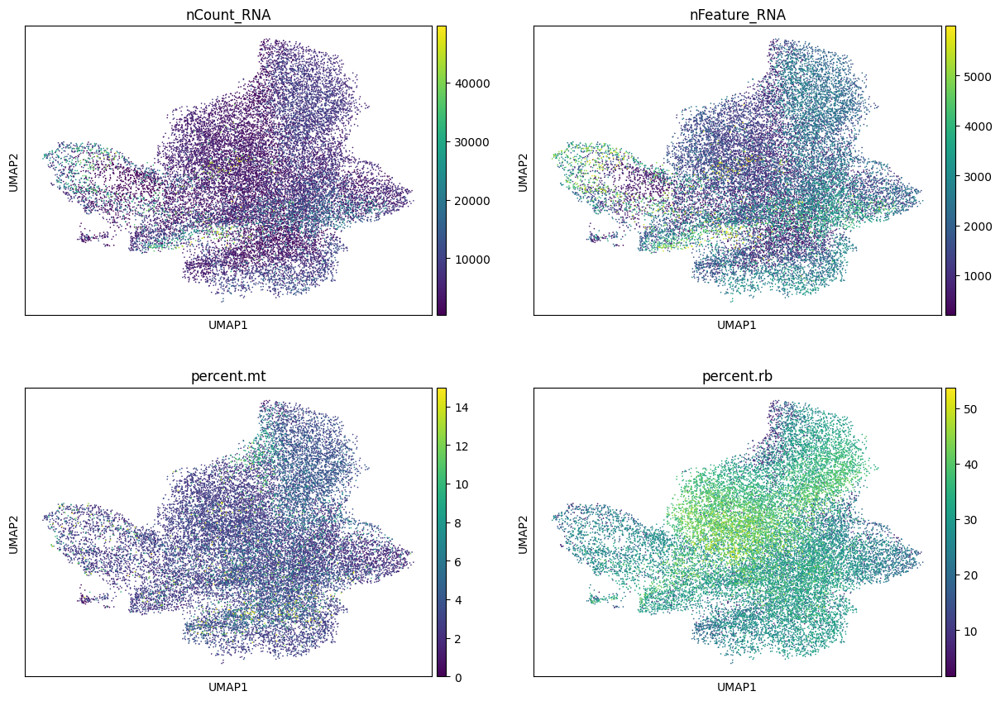

In [66]:
sc.pl.umap(adata, color=["nCount_RNA", "nFeature_RNA","percent.mt","percent.rb"], ncols=2)

In [67]:
adata.obs["day"] = adata.obs["day"].astype("category")
adata.obs["SNN_harmony20_res.0.3"] = adata.obs["SNN_harmony20_res.0.3"].astype("category")

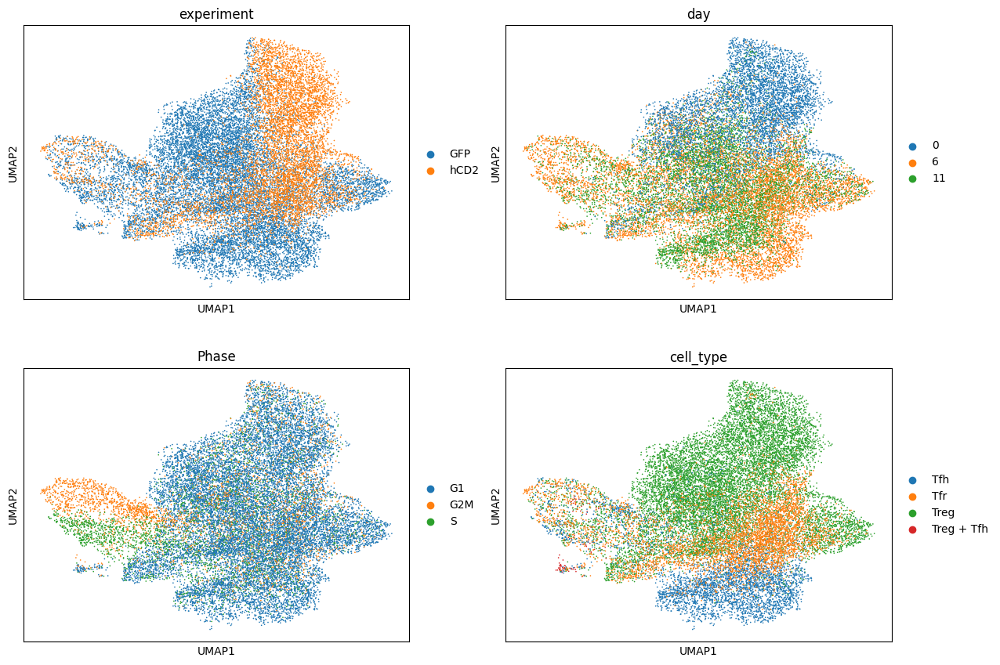

In [68]:
sc.pl.umap(adata, color=["experiment", "day","Phase","cell_type"], ncols=2)

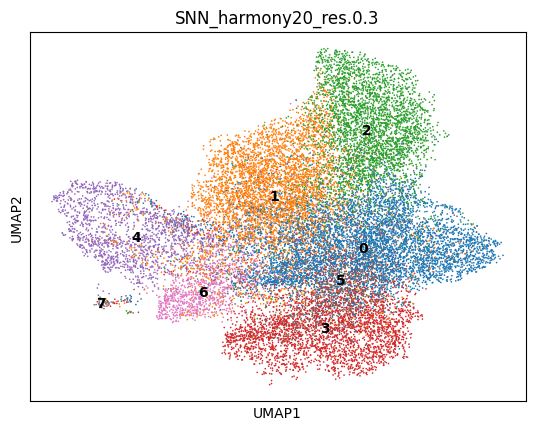

In [69]:
sc.pl.umap(adata, color=["SNN_harmony20_res.0.3"], ncols=2, legend_loc="on data")

In [70]:
adata.obs["SNN_harmony20_res.0.2"] = adata.obs["SNN_harmony20_res.0.2"].astype("category")
adata.obs["SNN_harmony20_res.0.4"] = adata.obs["SNN_harmony20_res.0.4"].astype("category")
adata.obs["SNN_harmony20_res.0.5"] = adata.obs["SNN_harmony20_res.0.5"].astype("category")
adata.obs["SNN_harmony20_res.0.6"] = adata.obs["SNN_harmony20_res.0.6"].astype("category")

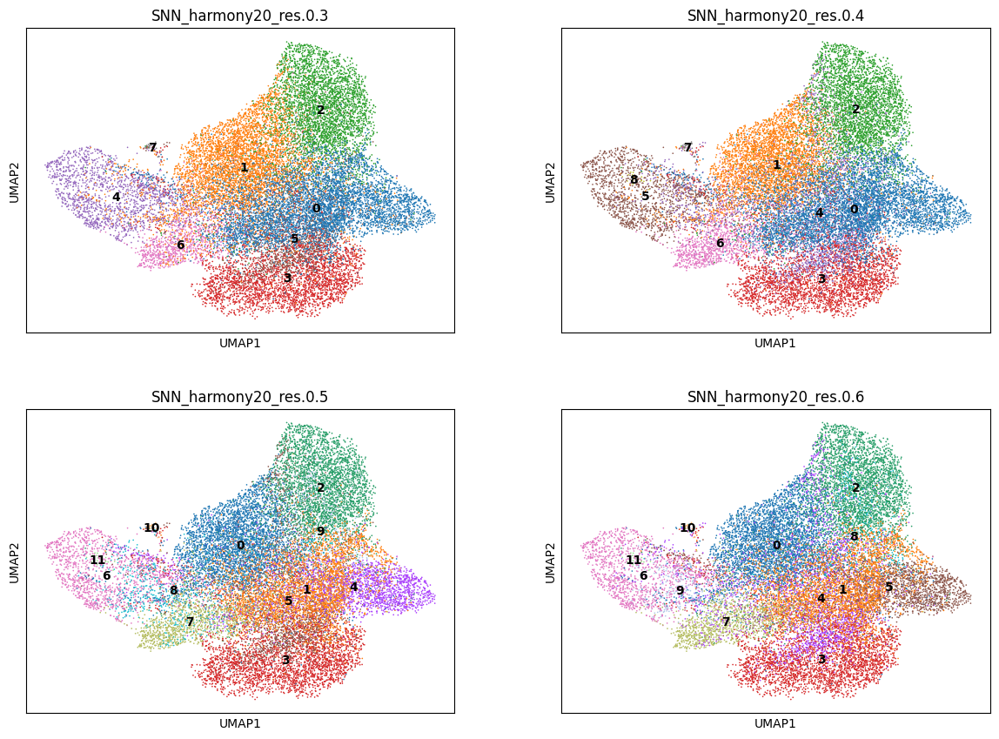

In [4]:
sc.pl.umap(adata, color=["SNN_harmony20_res.0.3","SNN_harmony20_res.0.4",
                         "SNN_harmony20_res.0.5","SNN_harmony20_res.0.6"],
           ncols=2, legend_loc="on data")

In [5]:
adata

AnnData object with n_obs × n_vars = 21255 × 33262
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'experiment', 'day', 'cell_type', 'S.Score', 'G2M.Score', 'Phase', 'SNN_harmony20_res.0.2', 'SNN_harmony20_res.0.3', 'SNN_harmony20_res.0.4', 'SNN_harmony20_res.0.5', 'SNN_harmony20_res.0.6', 'SNN_harmony20_res.0.7', 'SNN_harmony20_res.0.8', 'SNN_harmony20_res.0.9', 'SNN_harmony20_res.1', 'seurat_clusters', 'sample_type', 'D104T11_annotation'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Phase_colors', 'SNN_harmony20_res.0.3_colors', 'cell_type_colors', 'day_colors', 'experiment_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'data', 'scale_data'
    obsp: 'connectivities', 'distances'

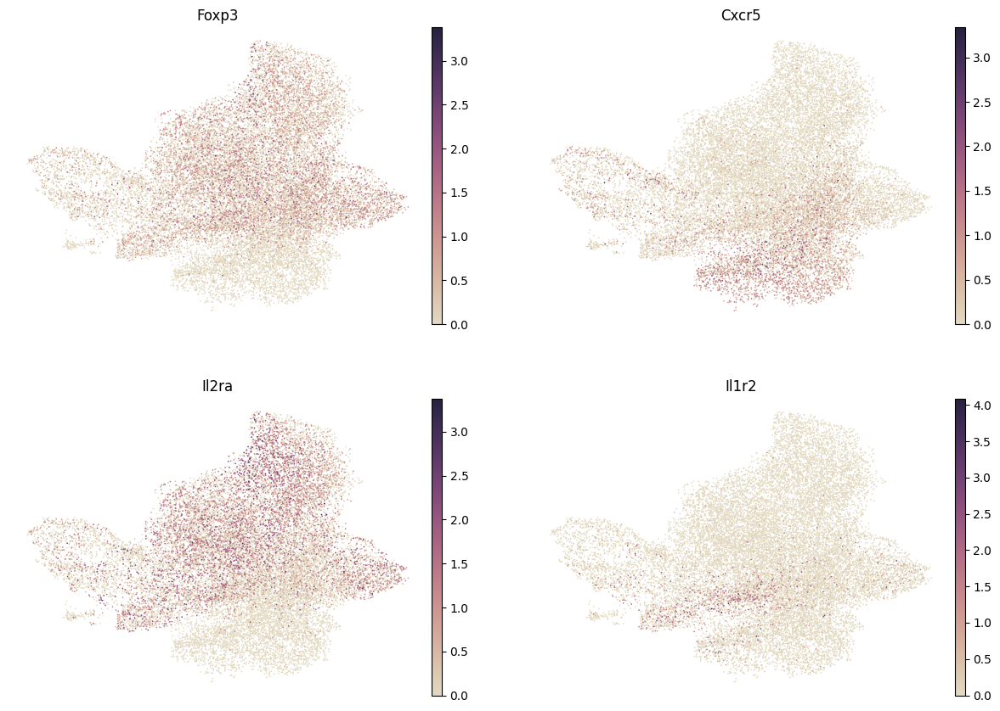

In [72]:
sc.pl.umap(adata, color=["Foxp3","Cxcr5","Il2ra","Il1r2"], ncols=2, 
           frameon=False, layer="data", color_map=sns.color_palette("ch:s=-.2,r=.6", as_cmap=True))

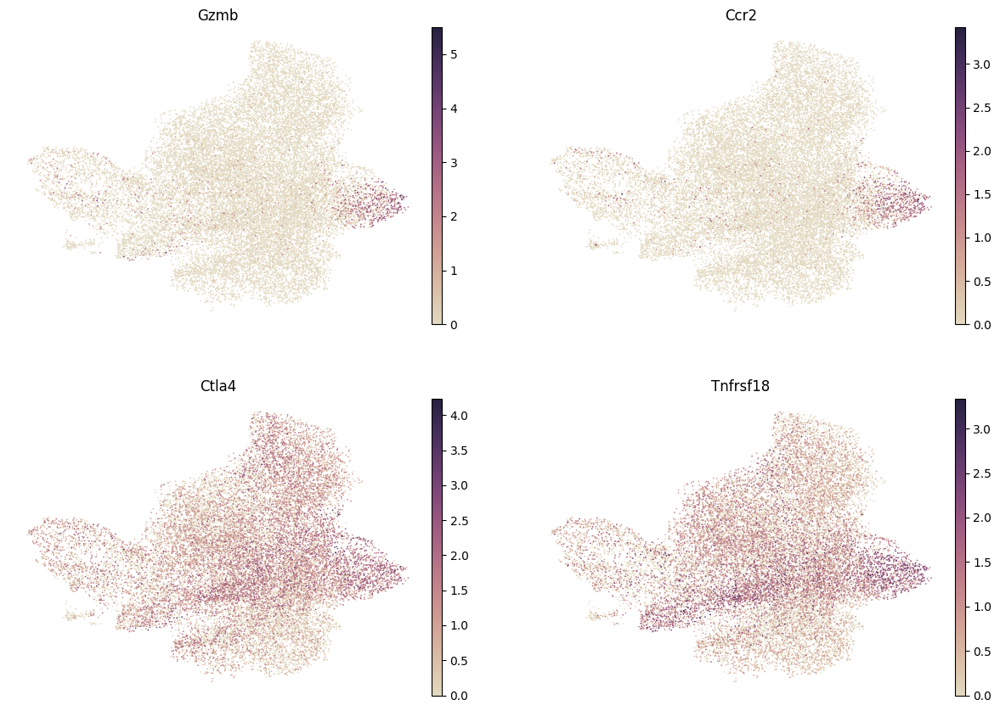

In [73]:
sc.pl.umap(adata, color=["Gzmb","Ccr2","Ctla4","Tnfrsf18"], ncols=2, 
           frameon=False, layer="data", color_map=sns.color_palette("ch:s=-.2,r=.6", as_cmap=True))

In [73]:
for res in np.arange(0.1, 1.1, 0.1):
    res = round(res, 2)
    sc.tl.leiden(adata, resolution=res, key_added=f"leidenalg_res_{res}", flavor="leidenalg", n_iterations=-1)

In [74]:
for res in np.arange(0.1, 1.1, 0.1):
    res = round(res, 2)
    sc.tl.leiden(adata, resolution=res, key_added=f"leiden_res_{res}", flavor="igraph", n_iterations=2)

In [27]:
adata

AnnData object with n_obs × n_vars = 21255 × 33262
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'experiment', 'day', 'cell_type', 'S.Score', 'G2M.Score', 'Phase', 'SNN_harmony20_res.0.2', 'SNN_harmony20_res.0.3', 'SNN_harmony20_res.0.4', 'SNN_harmony20_res.0.5', 'SNN_harmony20_res.0.6', 'SNN_harmony20_res.0.7', 'SNN_harmony20_res.0.8', 'SNN_harmony20_res.0.9', 'SNN_harmony20_res.1', 'seurat_clusters', 'sample_type', 'D104T11_annotation', 'leiden_res_0.1', 'leiden_res_0.2', 'leiden_res_0.3', 'leiden_res_0.4', 'leiden_res_0.5', 'leiden_res_0.6', 'leiden_res_0.7', 'leiden_res_0.8', 'leiden_res_0.9', 'leiden_res_1.0'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'experiment_colors', 'day_colors', 'Phase_colors', 'cell_type_colors', 'SNN_harmony20_res.0.3_colors', 'SNN_harmony20_res.0.4_colors', 'SNN_harmony20_res.0.5_colors', 'SNN_harmony20_res.0.6_colors', 'leid

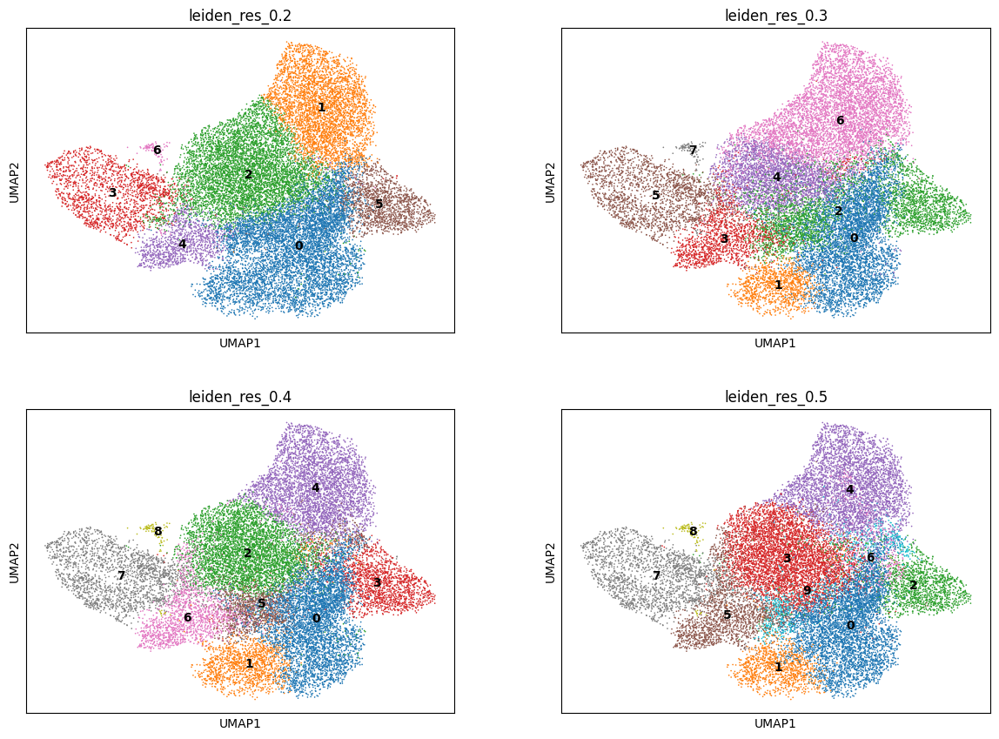

In [5]:
sc.pl.umap(adata, color=["leiden_res_0.2","leiden_res_0.3",
                        "leiden_res_0.4","leiden_res_0.5"], 
           legend_loc="on data", ncols=2)

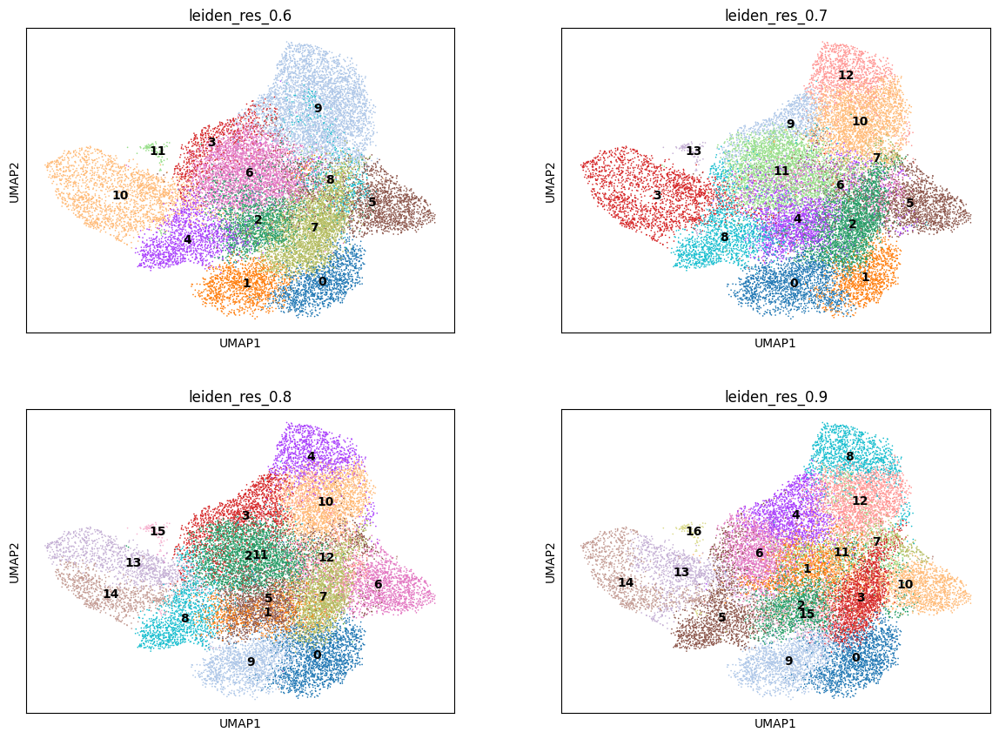

In [6]:
sc.pl.umap(adata, color=["leiden_res_0.6","leiden_res_0.7","leiden_res_0.8","leiden_res_0.9"], 
           legend_loc="on data", ncols=2)

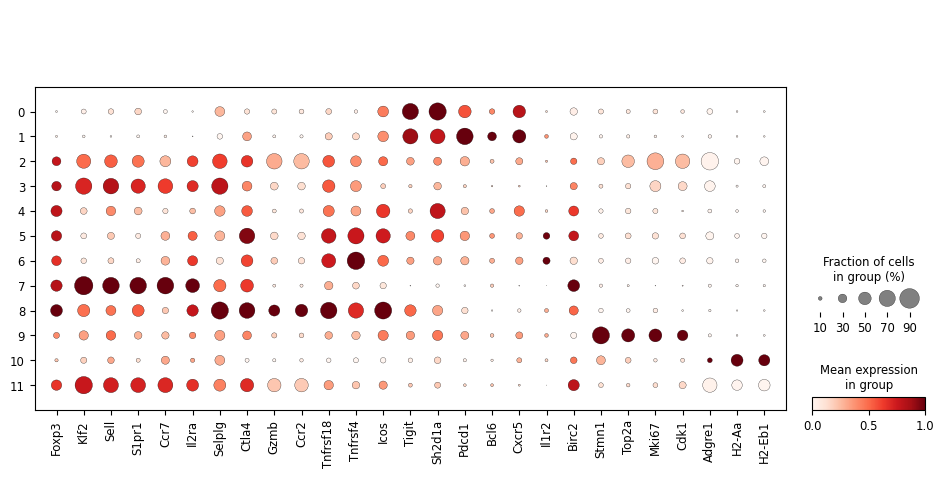

In [78]:
marker_genes = ["Foxp3","Klf2","Sell","S1pr1","Ccr7","Il2ra","Selplg","Ctla4",
            "Gzmb","Ccr2","Tnfrsf18","Tnfrsf4","Icos","Tigit","Sh2d1a","Pdcd1",
            "Bcl6","Cxcr5","Il1r2","Birc2","Stmn1","Top2a","Mki67","Cdk1",
            "Adgre1","H2-Aa","H2-Eb1"]

sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_0.7", standard_scale="var")

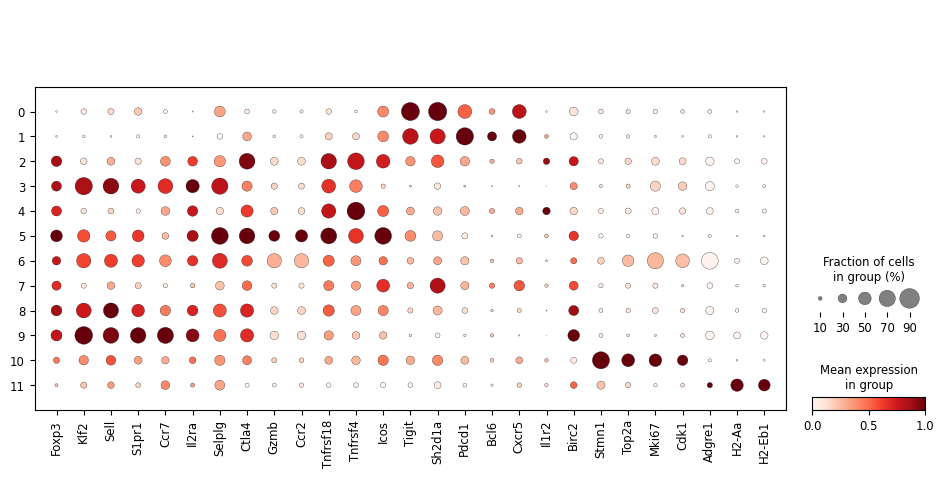

In [92]:
marker_genes = ["Foxp3","Klf2","Sell","S1pr1","Ccr7","Il2ra","Selplg","Ctla4",
            "Gzmb","Ccr2","Tnfrsf18","Tnfrsf4","Icos","Tigit","Sh2d1a","Pdcd1",
            "Bcl6","Cxcr5","Il1r2","Birc2","Stmn1","Top2a","Mki67","Cdk1",
            "Adgre1","H2-Aa","H2-Eb1"]

sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_0.6", standard_scale="var")

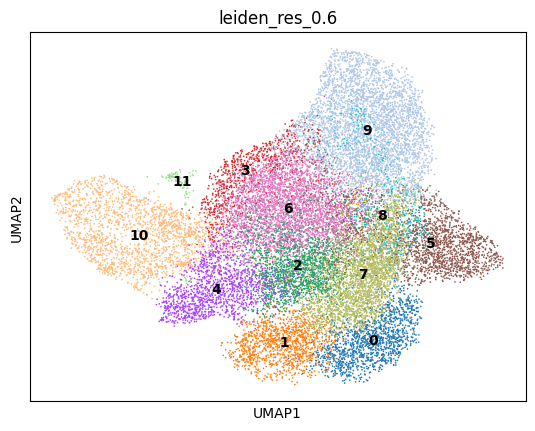

In [94]:
sc.pl.umap(adata, color=["leiden_res_0.6"], 
           legend_loc="on data", ncols=1)

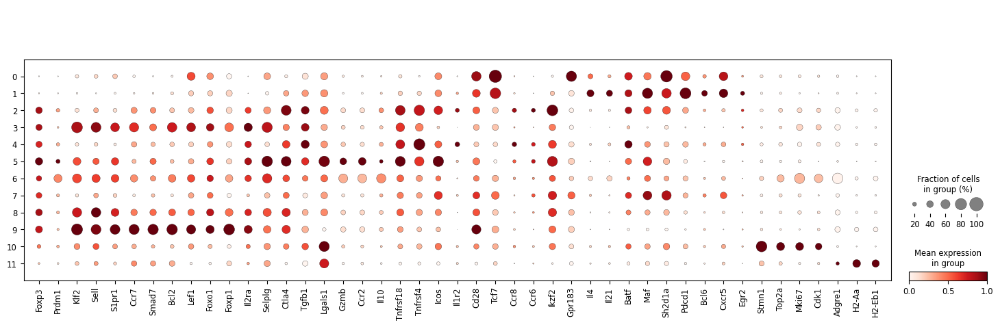

In [59]:
marker_genes = ["Foxp3","Prdm1","Klf2","Sell","S1pr1","Ccr7","Smad7",
            "Bcl2","Lef1","Foxo1","Foxp1","Il2ra","Selplg","Ctla4","Tgfb1",
            "Lgals1","Gzmb","Ccr2","Il10","Tnfrsf18","Tnfrsf4","Icos",
            "Il1r2","Cd28","Tcf7","Ccr8","Ccr6","Ikzf2","Gpr183","Il4","Il21",
            "Batf","Maf","Sh2d1a","Pdcd1","Bcl6","Cxcr5","Egr2","Stmn1","Top2a","Mki67","Cdk1",
            "Adgre1","H2-Aa","H2-Eb1"]

sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_0.6", standard_scale="var")

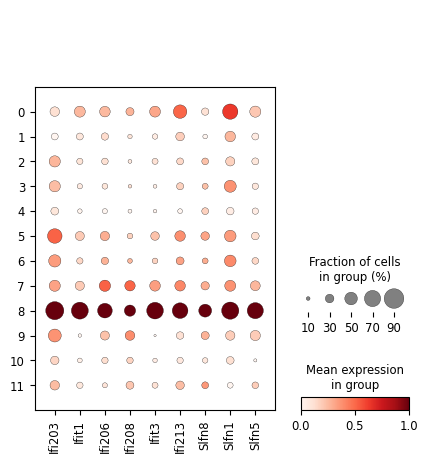

In [96]:
marker_genes = ["Ifi203","Ifit1","Ifi206","Ifi208","Ifit3","Ifi213",
            "Slfn8","Slfn1","Slfn5"]

sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_0.6", standard_scale="var")

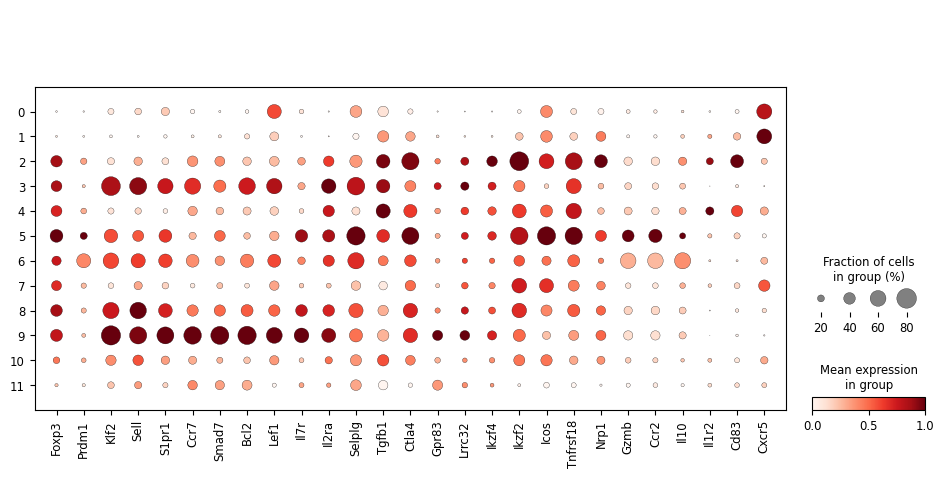

In [60]:
marker_genes = ["Foxp3","Prdm1","Klf2","Sell","S1pr1","Ccr7","Smad7",
            "Bcl2","Lef1","Il7r","Il2ra","Selplg","Tgfb1","Ctla4","Gpr83","Lrrc32","Ikzf4",
            "Ikzf2","Icos","Tnfrsf18","Nrp1","Gzmb","Ccr2","Il10","Il1r2","Cd83","Cxcr5"]

sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_0.6", standard_scale="var")

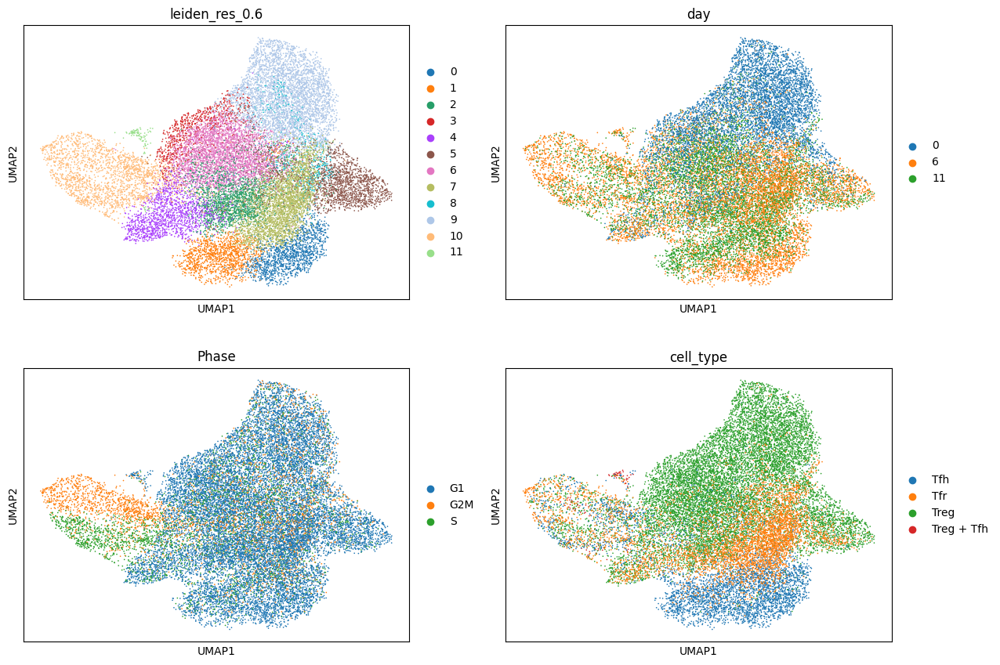

In [128]:
sc.pl.umap(adata, color=["leiden_res_0.6", "day","Phase","cell_type"], ncols=2)

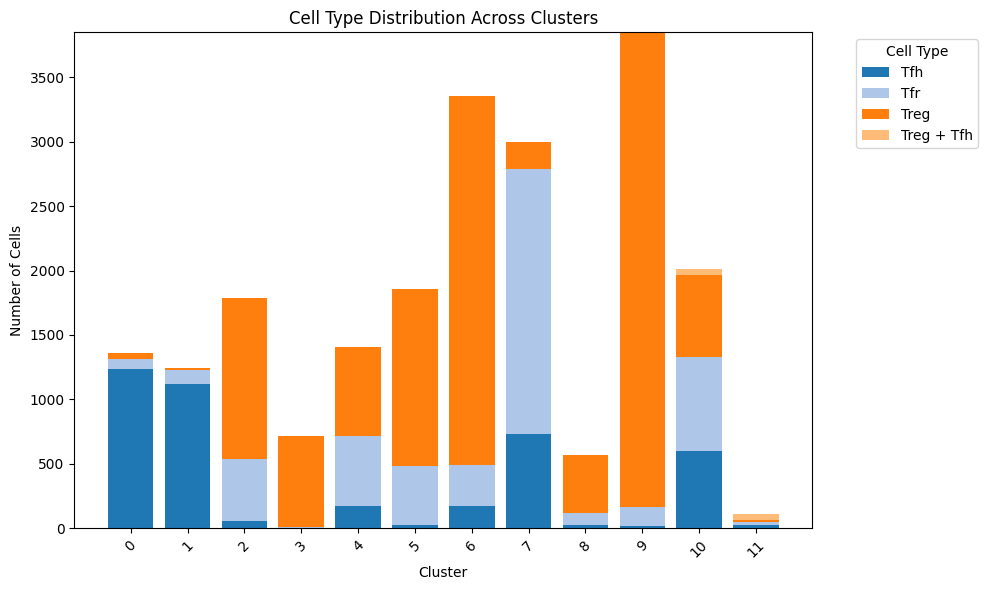

In [129]:
# Step 1: Count cells per cluster and cell type
counts_df = (
    adata.obs[['leiden_res_0.6', 'cell_type']]
    .groupby(['leiden_res_0.6', 'cell_type'])
    .size()
    .reset_index(name='count')
)

# Step 2: Pivot to wide format (clusters as rows, cell types as columns)
pivot_df = counts_df.pivot_table(
    index='leiden_res_0.6',
    columns='cell_type',
    values='count',
    fill_value=0
)

# Step 3: Plot stacked bar chart with cell type colors
fig, ax = plt.subplots(figsize=(10, 6))

bottom = pd.Series(0, index=pivot_df.index)
colors = plt.get_cmap('tab20').colors  # You can customize the colormap
cell_types = pivot_df.columns

for i, cell_type in enumerate(cell_types):
    ax.bar(
        pivot_df.index,
        pivot_df[cell_type],
        bottom=bottom,
        label=cell_type,
        color=colors[i % len(colors)]
    )
    bottom += pivot_df[cell_type]

ax.set_ylabel("Number of Cells")
ax.set_xlabel("Cluster")
ax.set_title("Cell Type Distribution Across Clusters")
ax.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

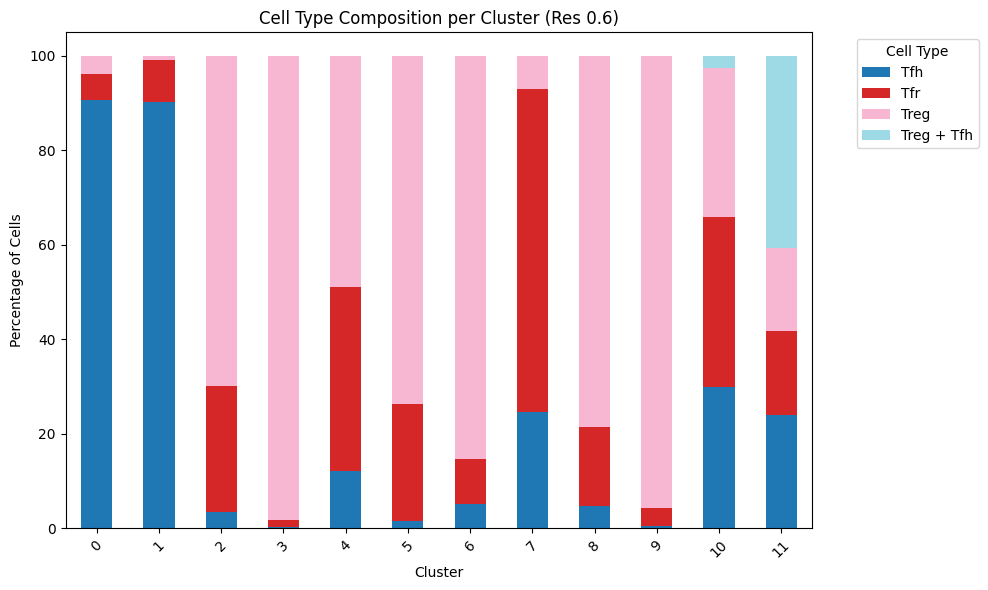

In [141]:
# Step 1: Create a DataFrame with cluster and cell type
counts_df = (
    adata.obs[['leiden_res_0.6', 'cell_type']]
    .groupby(['leiden_res_0.6', 'cell_type'])
    .size()
    .reset_index(name='count')
)

# Step 2: Pivot to wide format
pivot_df = counts_df.pivot_table(
    index='leiden_res_0.6',
    columns='cell_type',
    values='count',
    fill_value=0
)

# Step 3: Convert to percentages (row-wise normalization)
percentage_df = pivot_df.div(pivot_df.sum(axis=1), axis=0) * 100

# Step 4: Plot stacked bar chart
percentage_df.sort_index(inplace=True)  # Optional: sort clusters
percentage_df.plot(
    kind='bar',
    stacked=True,
    figsize=(10, 6),
    colormap='tab20'  # You can change colormap if needed
)

plt.ylabel("Percentage of Cells")
plt.xlabel("Cluster")
plt.title("Cell Type Composition per Cluster (Res 0.6)")
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

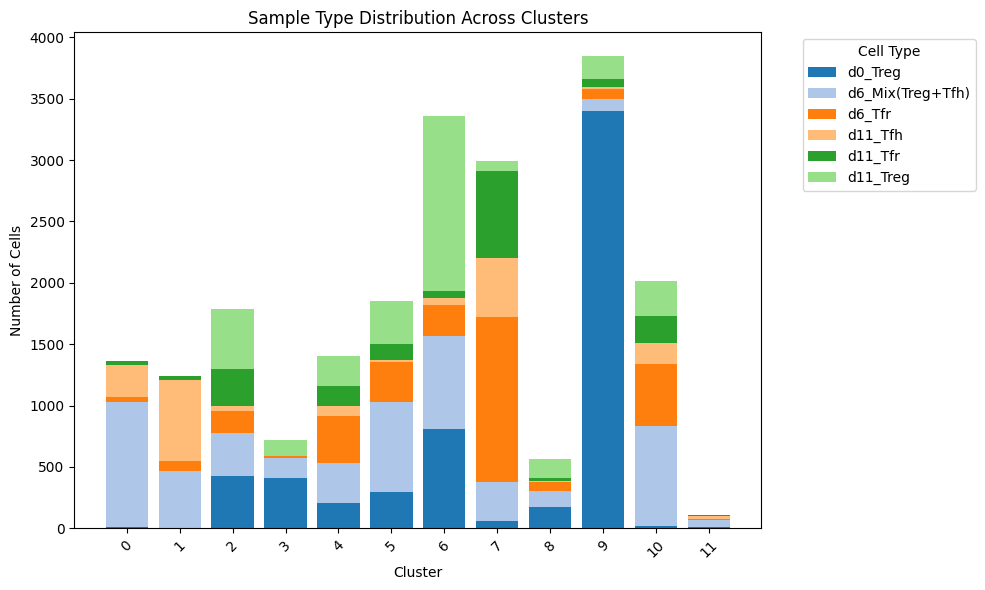

In [7]:
# Step 1: Count cells per cluster and sample
counts_df = (
    adata.obs[['leiden_res_0.6', 'sample_type']]
    .groupby(['leiden_res_0.6', 'sample_type'])
    .size()
    .reset_index(name='count')
)

# Step 2: Pivot to wide format (clusters as rows, cell types as columns)
pivot_df = counts_df.pivot_table(
    index='leiden_res_0.6',
    columns='sample_type',
    values='count',
    fill_value=0
)

# Step 3: Plot stacked bar chart with cell type colors
fig, ax = plt.subplots(figsize=(10, 6))

bottom = pd.Series(0, index=pivot_df.index)
colors = plt.get_cmap('tab20').colors  # You can customize the colormap
cell_types = pivot_df.columns

for i, cell_type in enumerate(cell_types):
    ax.bar(
        pivot_df.index,
        pivot_df[cell_type],
        bottom=bottom,
        label=cell_type,
        color=colors[i % len(colors)]
    )
    bottom += pivot_df[cell_type]

ax.set_ylabel("Number of Cells")
ax.set_xlabel("Cluster")
ax.set_title("Sample Type Distribution Across Clusters")
ax.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

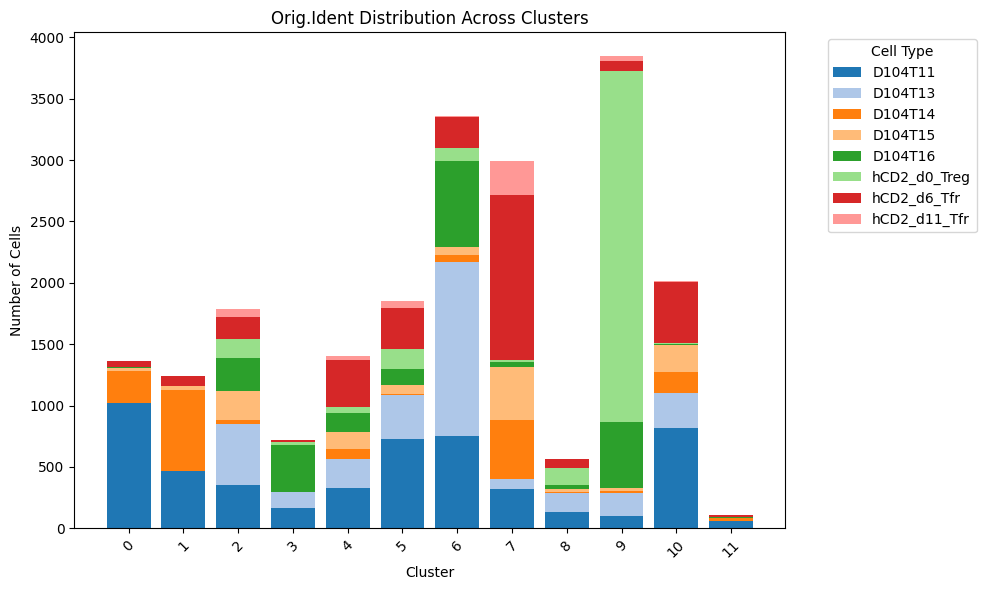

In [8]:
# Step 1: Count cells per cluster and sample
counts_df = (
    adata.obs[['leiden_res_0.6', 'orig.ident']]
    .groupby(['leiden_res_0.6', 'orig.ident'])
    .size()
    .reset_index(name='count')
)

# Step 2: Pivot to wide format (clusters as rows, cell types as columns)
pivot_df = counts_df.pivot_table(
    index='leiden_res_0.6',
    columns='orig.ident',
    values='count',
    fill_value=0
)

# Step 3: Plot stacked bar chart with cell type colors
fig, ax = plt.subplots(figsize=(10, 6))

bottom = pd.Series(0, index=pivot_df.index)
colors = plt.get_cmap('tab20').colors  # You can customize the colormap
cell_types = pivot_df.columns

for i, cell_type in enumerate(cell_types):
    ax.bar(
        pivot_df.index,
        pivot_df[cell_type],
        bottom=bottom,
        label=cell_type,
        color=colors[i % len(colors)]
    )
    bottom += pivot_df[cell_type]

ax.set_ylabel("Number of Cells")
ax.set_xlabel("Cluster")
ax.set_title("Orig.Ident Distribution Across Clusters")
ax.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

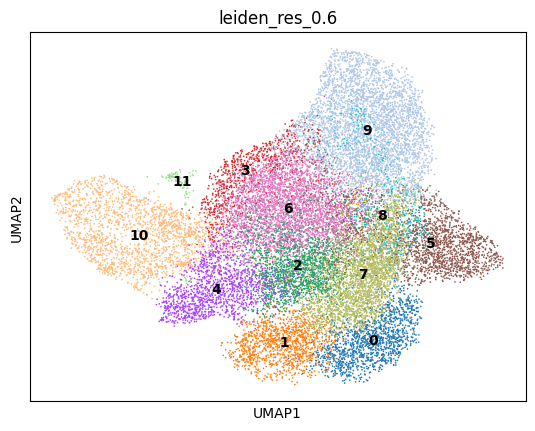

In [32]:
sc.pl.umap(adata, color=["leiden_res_0.6"], legend_loc="on data", ncols=2)

In [147]:
adata.obs["bbknn_annotation"] = adata.obs["leiden_res_0.6"].map(
    {
        "0": "Tfh Fol",
        "1": "GC-Tfh",
        "2": "Tfr_1",
        "3": "Treg_1",
        "4": "Tfr_2",
        "5": "eTreg",
        "6": "Treg_2",
        "7": "Tfr",
        "8": "Treg_3",
        "9": "Treg naive",
        "10": "CellCycle",
        "11": "APCs",
    }
)

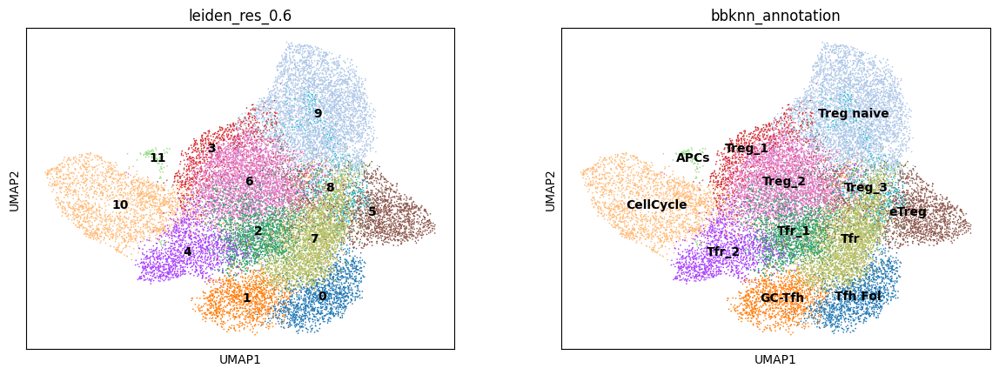

In [151]:
sc.pl.umap(adata, color=["leiden_res_0.6","bbknn_annotation"], 
           legend_loc="on data", ncols=2)

In [149]:
adata.write("analysis/integration/anndata_annot.h5ad")

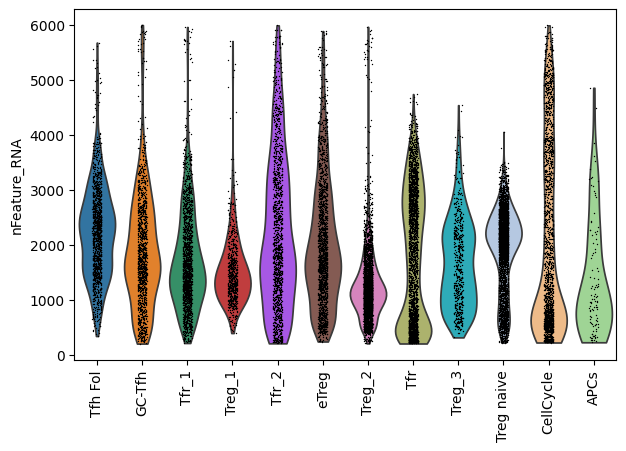

In [10]:
sc.pl.violin(adata, keys=["nFeature_RNA"], rotation=90,
             groupby="bbknn_annotation", layer="data")

In [5]:
low_feat_thr = 500
high_feat_thr = 3000

conditions = [
    adata.obs['nFeature_RNA'] < low_feat_thr,
    adata.obs['nFeature_RNA'] > high_feat_thr
]

# Create and assign the categorical column
adata.obs['coverage_cat'] = pd.Categorical(
    np.select(conditions, ['low_coverage', 'high_coverage'], default='mid_coverage'),
    categories=['low_coverage', 'mid_coverage', 'high_coverage'],  # ordered manually
    ordered=True  # optional: if you want to reflect order
)

In [8]:
adata.obs['coverage_cat'].value_counts()

mid_coverage     16706
high_coverage     2842
low_coverage      1707
Name: coverage_cat, dtype: int64

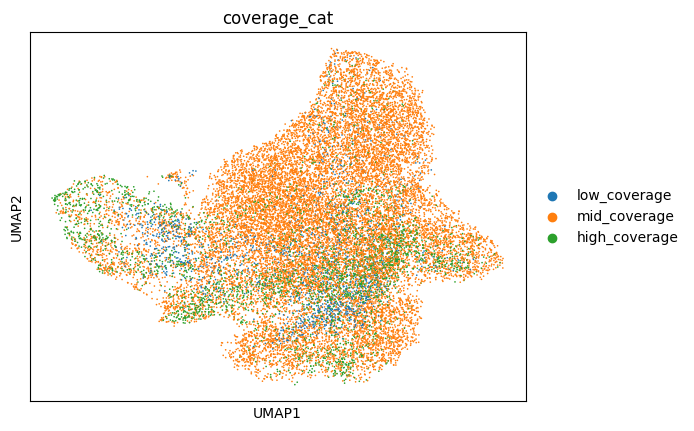

In [12]:
sc.pl.umap(adata, color=["coverage_cat"], ncols=2)

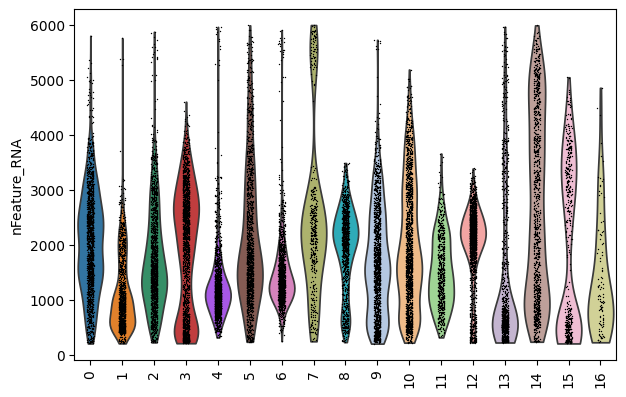

In [13]:
sc.pl.violin(adata, keys=["nFeature_RNA"], rotation=90,
             groupby="leiden_res_0.9", layer="data")

In [62]:
adata.obs[["bbknn_annotation"]].to_csv("analysis/integration/bbknn_annotation_metadata.csv")

In [10]:
harmony_annot = pd.read_csv("analysis/integration/harmony_annotation_metadata.csv", index_col=0)

In [11]:
harmony_annot = harmony_annot[["harmony_annot"]]

In [12]:
harmony_annot.head()

,harmony_annot
D104T11_AAACCTGAGATATGCA-1,Tfh Fol
D104T11_AAACCTGCAAACCCAT-1,eTreg
D104T11_AAACCTGCACAGAGGT-1,Treg_2
D104T11_AAACCTGCAGGTTTCA-1,Tfr_1
D104T11_AAACCTGCATCCCACT-1,eTreg


In [13]:
print((harmony_annot.index.isin(adata.obs_names)).sum(), "/", len(harmony_annot))

21255 / 21255


In [14]:
adata.obs.loc[harmony_annot.index, "harmony_annotation"] = harmony_annot["harmony_annot"]

In [8]:
pal = ["#DF9ED4","#D5769F","#CC4E6A","#D16258","#DF9D5D","#DCC863","#98B46C",
           "#53A074","#428181","#3E5F90","#4A4999","#6E4499","#924099"]

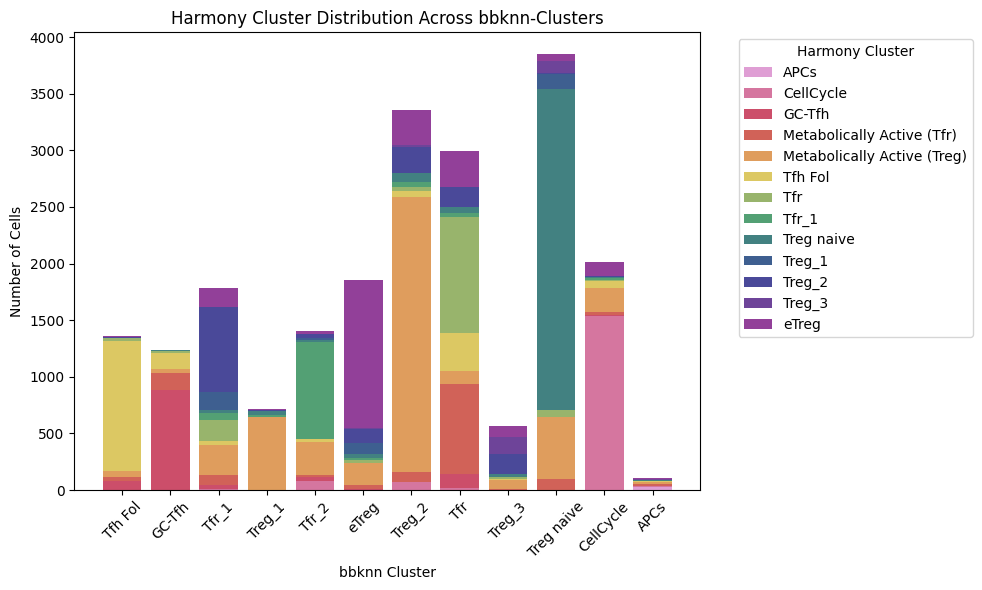

In [29]:
# Step 1: Count cells per cluster for the different annotations
counts_df = (
    adata.obs[['bbknn_annotation', 'harmony_annotation']]
    .groupby(['bbknn_annotation', 'harmony_annotation'])
    .size()
    .reset_index(name='count')
)

# Step 2: Pivot to wide format (clusters as rows, cell types as columns)
pivot_df = counts_df.pivot_table(
    index='bbknn_annotation',
    columns='harmony_annotation',
    values='count',
    fill_value=0
)

# Step 3: Plot stacked bar chart with cell type colors
fig, ax = plt.subplots(figsize=(10, 6))

bottom = pd.Series(0, index=pivot_df.index)
clusters = pivot_df.columns

for i, clusters in enumerate(clusters):
    ax.bar(
        pivot_df.index,
        pivot_df[clusters],
        bottom=bottom,
        label=clusters,
        color=pal[i % len(colors)]
    )
    bottom += pivot_df[clusters]

ax.set_ylabel("Number of Cells")
ax.set_xlabel("bbknn Cluster")
ax.set_title("Harmony Cluster Distribution Across bbknn-Clusters")
ax.legend(title='Harmony Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

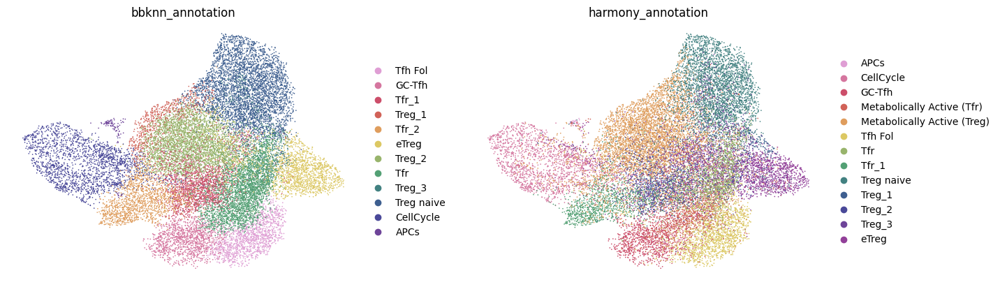

In [15]:
sc.pl.umap(adata, color=["bbknn_annotation","harmony_annotation"], 
           legend_loc="right margin", ncols=2, palette=pal, frameon=False, wspace=0.2)

In [50]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden_res_0.6", method="wilcoxon", 
                        layer="data", reference="rest", pts=True)

In [56]:
tfr_1 = sc.get.rank_genes_groups_df(adata, group="2")
tfr_1["pct_diff"] = tfr_1["pct_nz_group"] - tfr_1["pct_nz_reference"]
mktfr_1 = tfr_1[(tfr_1["pvals"] < 0.05) & (abs(tfr_1["pct_diff"]) > 0.1)]
mktfr_1.sort_values(by="logfoldchanges", ascending=False).head(20)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
3,Cd83,24.686308,2.610651,1.500518e-134,1.247756e-130,0.459732,0.127087,0.332645
94,Il1r2,9.672674,2.122606,3.939478e-22,1.039960e-19,0.198546,0.063749,0.134797
147,Ccr8,7.888757,1.998950,3.052120e-15,4.656862e-13,0.153803,0.041712,0.112092
12,Cd74,19.214214,1.922009,2.814630e-82,7.201554e-79,0.412752,0.155134,0.257617
6,Bhlhe40,21.221479,1.904050,6.049118e-100,2.874368e-96,0.479866,0.206657,0.273208
62,Ebi3,11.061835,1.827037,1.921261e-28,7.988125e-26,0.255034,0.106539,0.148494
155,Ccr6,7.767190,1.690703,8.024650e-15,1.170684e-12,0.180089,0.072944,0.107146
102,Capn3,9.171923,1.626648,4.646568e-20,1.096129e-17,0.222036,0.097961,0.124075
16,Cst7,17.571535,1.588292,4.070078e-69,7.521051e-66,0.441275,0.220630,0.220645
128,Pdcd1lg2,8.381010,1.564219,5.247524e-17,9.643267e-15,0.213647,0.100324,0.113323


In [61]:
tfr_2 = sc.get.rank_genes_groups_df(adata, group="4")
tfr_2["pct_diff"] = tfr_2["pct_nz_group"] - tfr_2["pct_nz_reference"]
mktfr_2 = tfr_2[(tfr_2["pvals"] < 0.05) & (abs(tfr_2["pct_diff"]) > 0.1)]
mktfr_2.sort_values(by="logfoldchanges", ascending=False).head(20)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
907,Bcat1,8.631042,3.523667,6.079539e-18,1.875859e-16,0.149573,0.012140,0.137432
272,Shmt1,14.316968,3.240446,1.714408e-46,1.827713e-44,0.257123,0.029520,0.227603
1393,Lad1,6.644112,3.046908,3.050511e-11,6.083100e-10,0.124644,0.019143,0.105501
15,Srm,29.155895,2.938146,7.033580e-187,1.462193e-183,0.563390,0.112790,0.450600
65,Mettl1,20.708921,2.879820,2.878251e-95,1.311457e-92,0.391026,0.061559,0.329467
1081,Dctd,7.877220,2.820890,3.347461e-15,8.691901e-14,0.143162,0.017228,0.125934
1078,Pdzk1ip1,7.896127,2.793039,2.877038e-15,7.487952e-14,0.152422,0.026951,0.125471
331,Smyd5,13.489884,2.768499,1.793825e-41,1.533836e-39,0.253561,0.037882,0.215679
985,Gjb2,8.272694,2.727788,1.309656e-16,3.713707e-15,0.153846,0.021762,0.132084
29,Nop16,24.736719,2.699255,4.308742e-135,4.777246e-132,0.484330,0.096318,0.388013


In [55]:
treg_3 = sc.get.rank_genes_groups_df(adata, group="8")
treg_3["pct_diff"] = treg_3["pct_nz_group"] - treg_3["pct_nz_reference"]
mktreg_3 = treg_3[(treg_3["pvals"] < 0.05) & (abs(treg_3["pct_diff"]) > 0.1)]
mktreg_3.sort_values(by="logfoldchanges", ascending=False).head(20)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
27,Rsad2,15.758449,3.362245,6.009004e-56,7.138268e-53,0.453097,0.082069,0.371029
0,Ifit1,25.139297,3.257335,1.850362e-139,6.154675e-135,0.741593,0.219526,0.522067
1,Ifit3,24.026228,3.142625,1.479693e-127,2.460877e-123,0.723894,0.202272,0.521622
157,Mx1,6.013313,3.108345,1.817691e-09,3.285871e-07,0.178761,0.033639,0.145122
63,Cmpk2,11.018971,3.051205,3.095747e-28,1.608918e-25,0.327434,0.064379,0.263055
52,Ifit3b,12.173857,2.865546,4.283565e-34,2.688301e-31,0.373451,0.086322,0.287129
215,A930037H05Rik,4.641956,2.826540,3.451260e-06,3.878237e-04,0.141593,0.028758,0.112835
5,Slfn5,21.748714,2.771389,7.104263e-105,3.938367e-101,0.699115,0.308362,0.390754
140,Oasl1,6.627585,2.716937,3.412218e-11,7.093575e-09,0.201770,0.041373,0.160397
243,Oas2,4.256749,2.701395,2.074208e-05,1.889697e-03,0.136283,0.033543,0.102740


In [53]:
treg_1 = sc.get.rank_genes_groups_df(adata, group="3")
treg_1["pct_diff"] = treg_1["pct_nz_group"] - treg_1["pct_nz_reference"]
mktreg_1 = treg_1[(treg_1["pvals"] < 0.05) & (abs(treg_1["pct_diff"]) > 0.1)]
mktreg_1.sort_values(by="logfoldchanges", ascending=False).head(20)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
23,Igfbp4,15.704744,2.330256,1.403433e-55,1.609689e-52,0.479050,0.153659,0.325391
37,Ly6c1,14.329198,2.014268,1.437724e-46,1.017480e-43,0.466480,0.166172,0.300309
71,Ctsw,11.564034,1.931410,6.269305e-31,2.172184e-28,0.371508,0.128293,0.243216
45,Ecm1,13.812274,1.872522,2.149368e-43,1.254250e-40,0.469274,0.200253,0.269021
260,Gm45552,5.265137,1.867533,1.400847e-07,6.842142e-06,0.162011,0.046984,0.115027
116,Slc17a9,9.299743,1.772637,1.407860e-20,2.572980e-18,0.314246,0.121330,0.192916
5,Nr4a1,19.730331,1.635022,1.183920e-86,6.563255e-83,0.782123,0.467063,0.315060
151,Rcn1,7.531194,1.602941,5.027840e-14,5.707714e-12,0.275140,0.120064,0.155075
231,Fam208b,5.710349,1.442216,1.127447e-08,6.732702e-07,0.203911,0.079897,0.124014
69,Fam105a,11.655175,1.440196,2.159356e-31,7.640905e-29,0.435754,0.186864,0.248890


In [54]:
treg_2 = sc.get.rank_genes_groups_df(adata, group="6")
treg_2["pct_diff"] = treg_2["pct_nz_group"] - treg_2["pct_nz_reference"]
mktreg_2 = treg_2[(treg_2["pvals"] < 0.05) & (abs(treg_2["pct_diff"]) > 0.1)]
mktreg_2.sort_values(by="logfoldchanges", ascending=False).head(20)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
61,Igfbp4,25.665798,2.360102,2.817254e-145,1.186171e-142,0.384867,0.123310,0.261558
70,Ly6c1,20.723053,1.927430,2.146356e-95,5.027611e-93,0.351802,0.143368,0.208434
36,Gm11808,41.770893,1.311799,0.000000e+00,0.000000e+00,0.931189,0.812158,0.119031
83,Gm9493,16.427601,1.232114,1.213649e-60,1.245938e-58,0.358951,0.203878,0.155074
94,2810474O19Rik,14.497366,1.195342,1.258896e-47,7.915578e-46,0.318439,0.173092,0.145347
109,Fam105a,12.656726,1.070029,1.026931e-36,4.140339e-35,0.299672,0.175662,0.124010
60,Klf2,25.975266,1.047144,9.426661e-149,4.072073e-146,0.731308,0.501732,0.229576
58,mt-Nd4l,27.386992,1.017829,3.918502e-165,1.888945e-162,0.942210,0.838194,0.104016
78,Jun,17.770416,0.892751,1.197993e-70,1.606759e-68,0.577897,0.461448,0.116449
77,Bcl2,17.844641,0.884358,3.181443e-71,4.409215e-69,0.528448,0.365683,0.162765


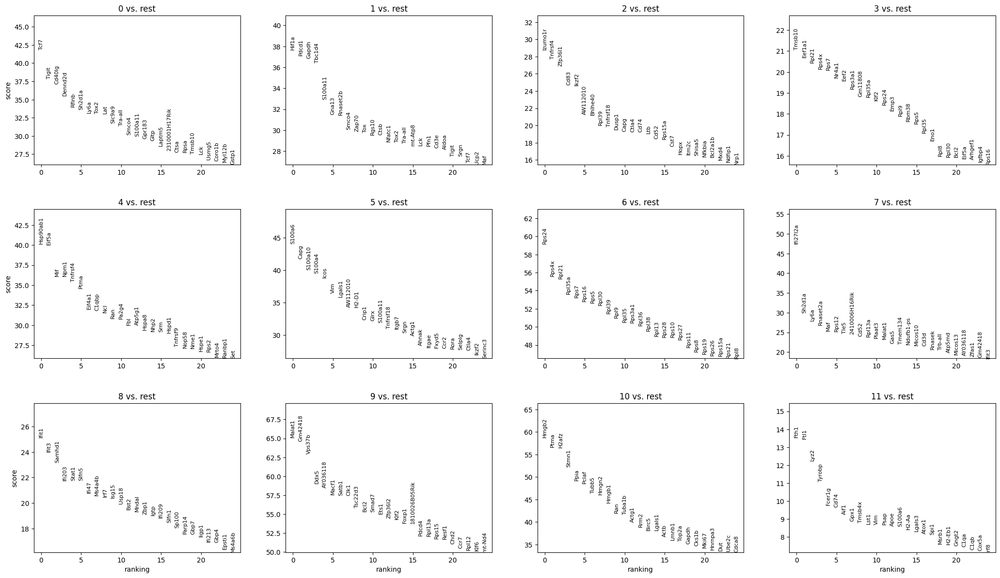

In [51]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

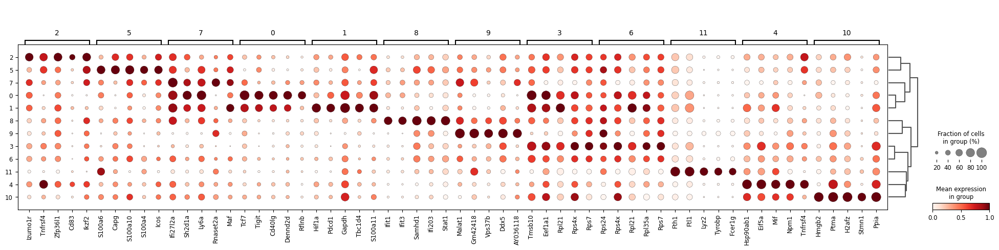

In [52]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_res_0.6", standard_scale="var", n_genes=5)

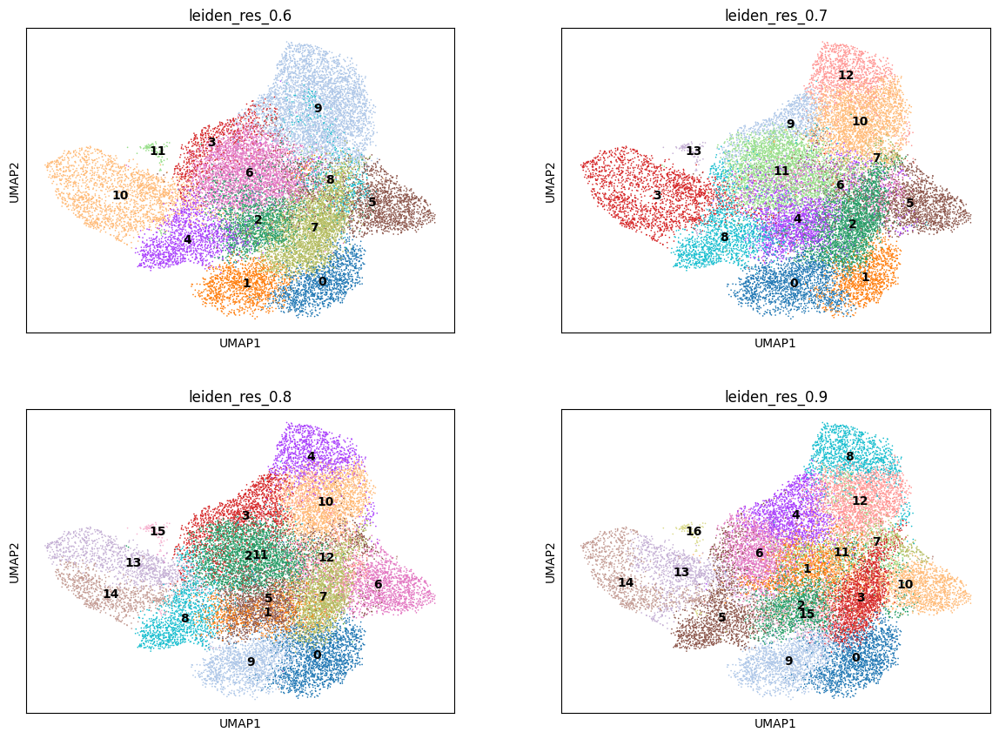

In [5]:
sc.pl.umap(adata, color=["leiden_res_0.6","leiden_res_0.7","leiden_res_0.8","leiden_res_0.9"], 
           legend_loc="on data", ncols=2)

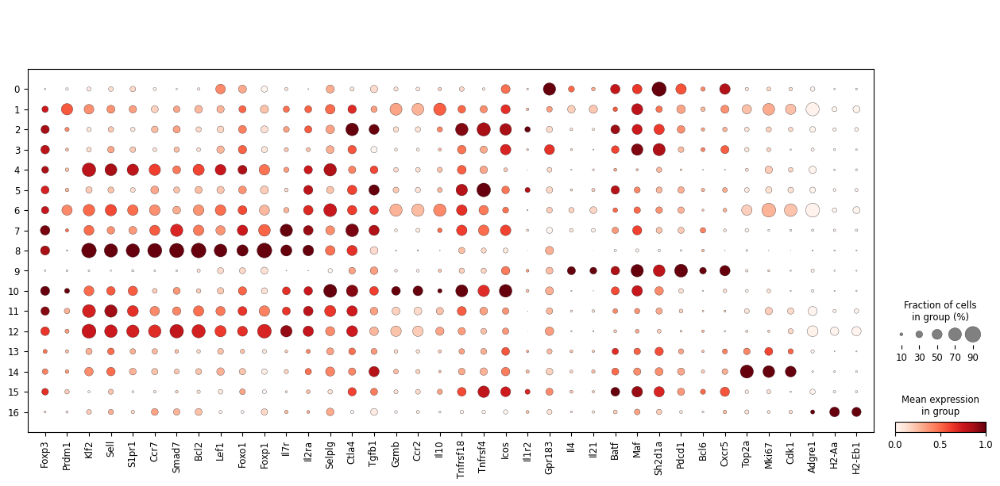

In [6]:
marker_genes = ["Foxp3","Prdm1","Klf2","Sell","S1pr1","Ccr7","Smad7",
            "Bcl2","Lef1","Foxo1","Foxp1","Il7r","Il2ra","Selplg","Ctla4","Tgfb1",
            "Gzmb","Ccr2","Il10","Tnfrsf18","Tnfrsf4","Icos",
            "Il1r2","Gpr183","Il4","Il21",
            "Batf","Maf","Sh2d1a","Pdcd1","Bcl6","Cxcr5","Top2a","Mki67","Cdk1",
            "Adgre1","H2-Aa","H2-Eb1"]

sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_0.9", standard_scale="var")

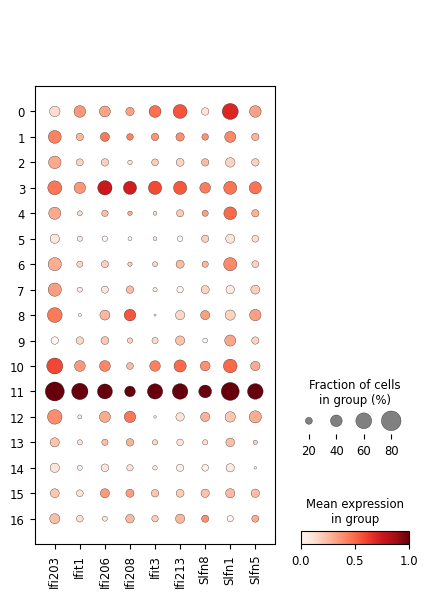

In [7]:
sc.pl.dotplot(adata, ["Ifi203","Ifit1","Ifi206","Ifi208","Ifit3","Ifi213",
            "Slfn8","Slfn1","Slfn5"], groupby="leiden_res_0.9", standard_scale="var")

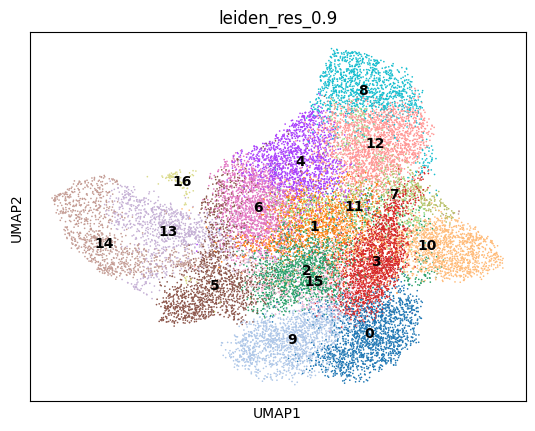

In [31]:
sc.pl.umap(adata, color=["leiden_res_0.9"], legend_loc="on data", ncols=1)

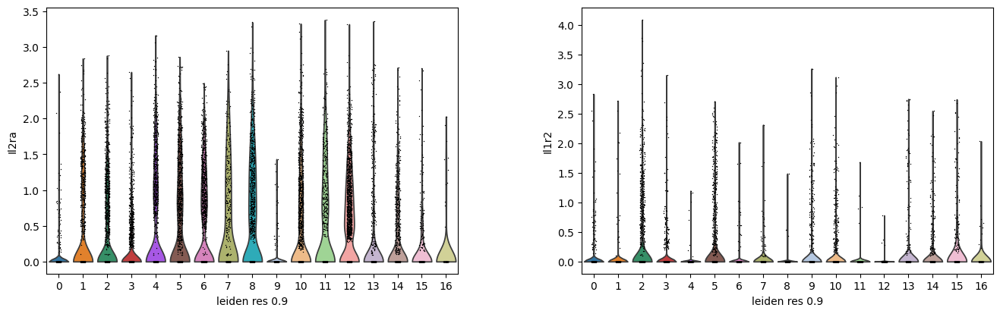

In [31]:
sc.pl.violin(adata, keys=["Il2ra","Il1r2"],
             groupby="leiden_res_0.9", layer="data")

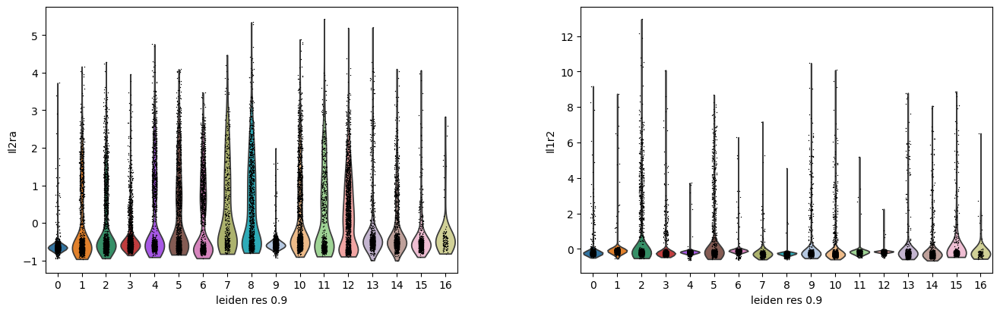

In [12]:
sc.pl.violin(adata, keys=["Il2ra","Il1r2"],
             groupby="leiden_res_0.9", layer="scale_data")

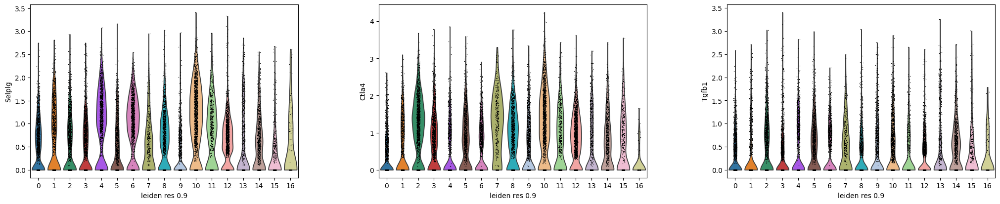

In [32]:
sc.pl.violin(adata, keys=["Selplg","Ctla4","Tgfb1"],
             groupby="leiden_res_0.9", layer="data")

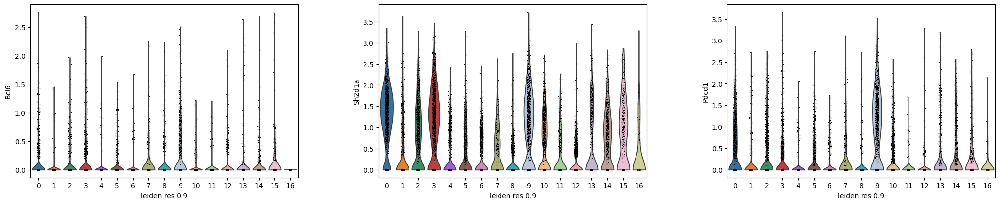

In [34]:
sc.pl.violin(adata, keys=["Bcl6","Sh2d1a","Pdcd1"],
             groupby="leiden_res_0.9", layer="data")

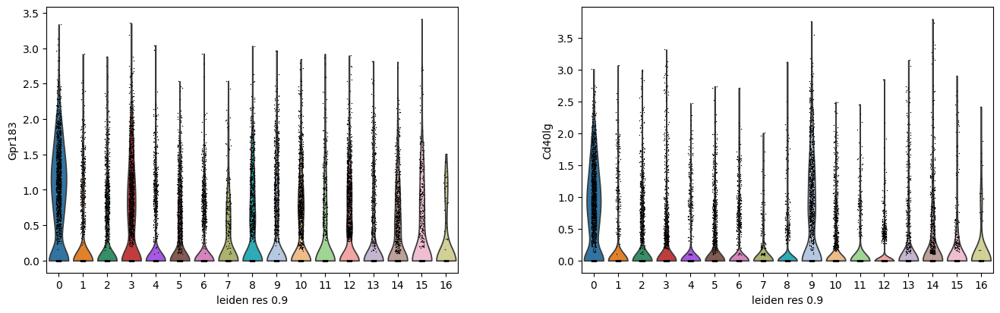

In [13]:
sc.pl.violin(adata, keys=["Gpr183","Cd40lg"],
             groupby="leiden_res_0.9", layer="data")

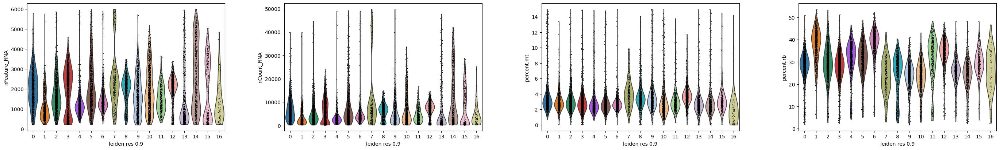

In [52]:
sc.pl.violin(adata, keys=["nFeature_RNA","nCount_RNA","percent.mt","percent.rb"],
             groupby="leiden_res_0.9", layer="data")

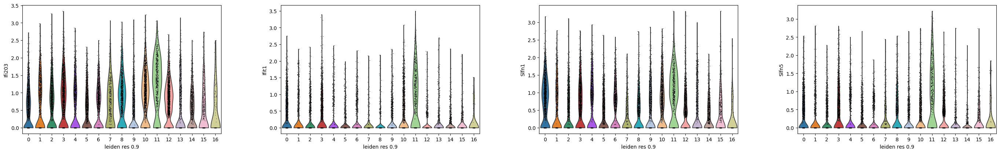

In [14]:
sc.pl.violin(adata, keys=["Ifi203","Ifit1","Slfn1","Slfn5"],
             groupby="leiden_res_0.9", layer="data")

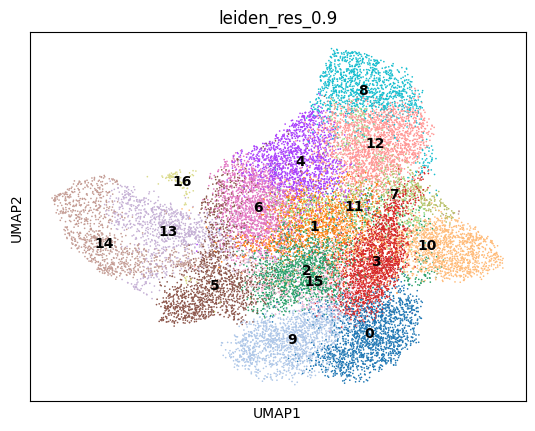

In [15]:
sc.pl.umap(adata, color=["leiden_res_0.9"], legend_loc="on data", ncols=1)

In [5]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden_res_0.9", method="wilcoxon", layer="data", reference="rest", pts=True)

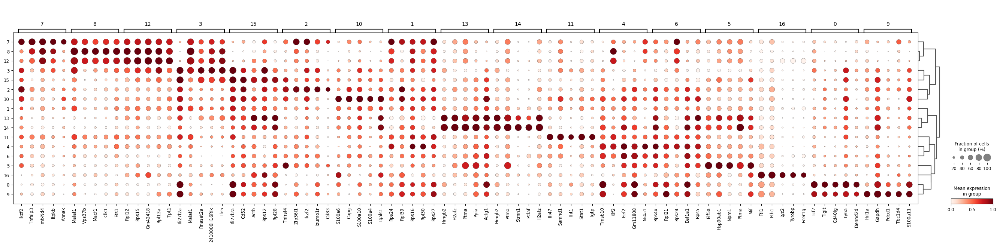

In [17]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_res_0.9", standard_scale="var", n_genes=5)

In [6]:
de_df = sc.get.rank_genes_groups_df(adata, group=None)

In [9]:
de_df["annot"] = de_df["group"].map(
    {
        "0": "Tfh",
        "1": "Treg/Tfr",
        "2": "Treg/Tfr",
        "3": "Tfr",
        "4": "Treg",
        "5": "Treg/Tfr",
        "6": "Treg",
        "7": "Treg",
        "8": "Treg_naive",
        "9": "Tfh",
        "10": "eTreg",
        "11": "Treg",
        "12": "Treg_naive",
        "13": "CellCycle",
        "14": "CellCycle",
        "15": "Tfr",
        "16": "APC"
    }
)

In [10]:
de_df["pct_diff"] = de_df["pct_nz_group"] - de_df["pct_nz_reference"]
de_df

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff,annot
0,0,Tcf7,41.826077,2.009786,0.000000e+00,0.000000e+00,0.896614,0.520484,0.376131,Tfh
1,0,Tigit,36.567013,2.537393,9.569230e-293,1.530439e-288,0.729746,0.197490,0.532256,Tfh
2,0,Cd40lg,36.556999,2.374563,1.380349e-292,1.530439e-288,0.732769,0.231672,0.501097,Tfh
3,0,Ly6a,35.257587,1.777768,2.625171e-272,2.182961e-268,0.927449,0.608693,0.318755,Tfh
4,0,Dennd2d,35.118835,2.096792,3.477692e-270,2.313500e-266,0.740024,0.285904,0.454120,Tfh
...,...,...,...,...,...,...,...,...,...,...
565449,16,Ets1,-9.008489,-2.013675,2.089150e-19,5.790775e-16,0.330275,0.767048,-0.436773,APC
565450,16,Trb-all,-9.632466,-2.148600,5.831285e-22,2.155113e-18,0.568807,0.962641,-0.393833,APC
565451,16,Ms4a4b,-10.053694,-2.197810,8.848704e-24,4.204651e-20,0.385321,0.857609,-0.472288,APC
565452,16,Cd3e,-10.163551,-2.102474,2.883777e-24,1.598670e-20,0.440367,0.918566,-0.478199,APC


In [11]:
de_df.to_csv("analysis/integration/degs_all_unfilt.csv", index=False)

In [11]:
# compare Tfh clusters (0 and 9) - DEGs
sub_adata = adata[adata.obs["leiden_res_0.9"].isin(["0", "9"])].copy()

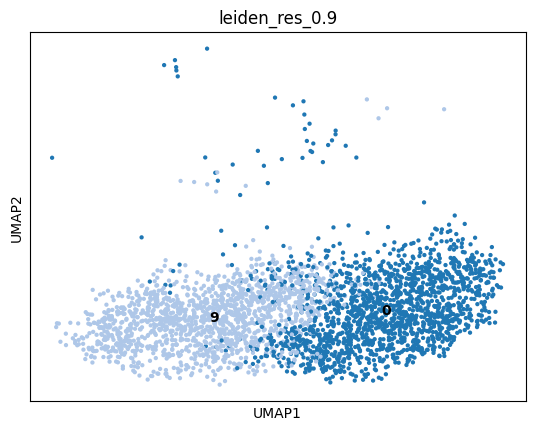

In [12]:
sc.pl.umap(sub_adata, color=["leiden_res_0.9"], legend_loc="on data", ncols=1)

In [13]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(sub_adata, groupby="leiden_res_0.9", method="wilcoxon", layer="data", reference="rest", pts=True)

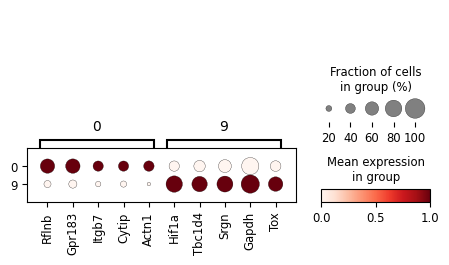

In [25]:
sc.pl.rank_genes_groups_dotplot(sub_adata, groupby="leiden_res_0.9", standard_scale="var", n_genes=5)

In [14]:
de_tfh_df = sc.get.rank_genes_groups_df(sub_adata, group=None)

In [15]:
de_tfh_df["pct_diff"] = de_tfh_df["pct_nz_group"] - de_tfh_df["pct_nz_reference"]
de_tfh_df

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
0,0,Rflnb,21.682365,2.082559,3.010077e-104,5.006059e-100,0.657195,0.254374,0.402821
1,0,Gpr183,19.490276,1.518579,1.327631e-84,1.103991e-80,0.735187,0.380888,0.354299
2,0,Itgb7,17.046612,1.321504,3.703929e-65,1.760001e-61,0.675333,0.362046,0.313287
3,0,Cytip,16.632544,1.132114,4.050325e-62,1.224745e-58,0.768440,0.487887,0.280553
4,0,Actn1,16.599367,2.268136,7.043059e-62,1.952219e-58,0.442563,0.104980,0.337584
...,...,...,...,...,...,...,...,...,...
66519,9,Actn1,-16.599367,-2.268136,7.043059e-62,1.952219e-58,0.104980,0.442563,-0.337584
66520,9,Cytip,-16.632544,-1.132114,4.050325e-62,1.224745e-58,0.487887,0.768440,-0.280553
66521,9,Itgb7,-17.046612,-1.321504,3.703929e-65,1.760001e-61,0.362046,0.675333,-0.313287
66522,9,Gpr183,-19.490276,-1.518579,1.327631e-84,1.103991e-80,0.380888,0.735187,-0.354299


In [16]:
de_tfh_df["annot"] = np.where(de_tfh_df["group"] == "0", "Tfh_fol",
                       np.where(de_tfh_df["group"] == "9", "Tfh_GC", None))

In [19]:
de_tfh_df[de_tfh_df["names"].isin(["Gpr183","Cxcr5","Bcl6","Cd40lg"])].sort_values(by='logfoldchanges', ascending=False).head(10)

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff,annot
1,0,Gpr183,19.490276,1.518579,1.327631e-84,1.103991e-80,0.735187,0.380888,0.354299,Tfh_fol
33343,9,Bcl6,6.969046,1.403643,3.190978e-12,2.666078e-10,0.290040,0.161427,0.128614,Tfh_GC
33508,9,Cxcr5,3.082854,0.367562,2.050259e-03,3.562994e-02,0.524899,0.525998,-0.001099,Tfh_GC
590,0,Cd40lg,5.208451,0.241652,1.904232e-07,8.821528e-06,0.732769,0.578735,0.154034,Tfh_fol
65933,9,Cd40lg,-5.208451,-0.241652,1.904232e-07,8.821528e-06,0.578735,0.732769,-0.154034,Tfh_GC
33015,0,Cxcr5,-3.082854,-0.367562,2.050259e-03,3.562994e-02,0.525998,0.524899,0.001099,Tfh_fol
33180,0,Bcl6,-6.969046,-1.403643,3.190978e-12,2.666078e-10,0.161427,0.290040,-0.128614,Tfh_fol
66522,9,Gpr183,-19.490276,-1.518579,1.327631e-84,1.103991e-80,0.380888,0.735187,-0.354299,Tfh_GC


In [33]:
de_tfh_df.to_csv("analysis/integration/degs_tfh_unfilt.csv", index=False)

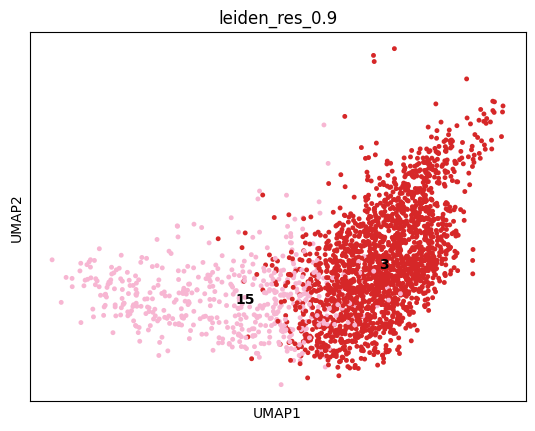

In [34]:
# compare Tfr clusters (3 and 15) - DEGs
sub_adata = adata[adata.obs["leiden_res_0.9"].isin(["3", "15"])].copy()
sc.pl.umap(sub_adata, color=["leiden_res_0.9"], legend_loc="on data", ncols=1)

In [35]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(sub_adata, groupby="leiden_res_0.9", method="wilcoxon", layer="data", reference="rest", pts=True)

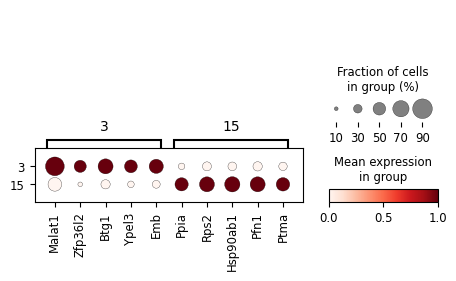

In [36]:
sc.pl.rank_genes_groups_dotplot(sub_adata, groupby="leiden_res_0.9", standard_scale="var", n_genes=5)

In [38]:
de_tfr_df = sc.get.rank_genes_groups_df(sub_adata, group=None)
de_tfr_df["pct_diff"] = de_tfr_df["pct_nz_group"] - de_tfr_df["pct_nz_reference"]
de_tfr_df

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
0,3,Malat1,16.358656,1.508399,3.773609e-60,1.255178e-55,0.968179,0.877193,0.090986
1,3,Zfp36l2,15.428208,1.811434,1.057662e-53,1.630500e-49,0.749087,0.471735,0.277352
2,3,Btg1,14.633222,1.302703,1.724265e-48,9.558752e-45,0.861242,0.672515,0.188727
3,3,Ypel3,12.590457,1.335093,2.382898e-36,8.806663e-33,0.674491,0.413255,0.261236
4,3,Emb,12.059805,1.333778,1.721912e-33,5.727424e-30,0.720396,0.526316,0.194081
...,...,...,...,...,...,...,...,...,...
66519,15,Emb,-12.059805,-1.333778,1.721912e-33,5.727424e-30,0.526316,0.720396,-0.194081
66520,15,Ypel3,-12.590457,-1.335093,2.382898e-36,8.806663e-33,0.413255,0.674491,-0.261236
66521,15,Btg1,-14.633222,-1.302703,1.724265e-48,9.558752e-45,0.672515,0.861242,-0.188727
66522,15,Zfp36l2,-15.428208,-1.811434,1.057662e-53,1.630500e-49,0.471735,0.749087,-0.277352


In [41]:
de_tfr_df[de_tfr_df["names"].isin(["Gpr183","Cxcr5","Bcl6","Cd40lg"])]

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
193,3,Gpr183,6.176009,0.694352,6.574233e-10,8.677465e-08,0.604591,0.463938,0.140653
3985,3,Cd40lg,0.295401,0.234594,7.676874e-01,1.000000e+00,0.250391,0.257310,-0.006919
27391,3,Cxcr5,-0.054766,0.055806,9.563252e-01,1.000000e+00,0.368805,0.382066,-0.013261
31407,3,Bcl6,-0.914224,-0.104244,3.605990e-01,1.000000e+00,0.143975,0.175439,-0.031464
35116,15,Bcl6,0.914224,0.104244,3.605990e-01,1.000000e+00,0.175439,0.143975,0.031464
39132,15,Cxcr5,0.054766,-0.055806,9.563252e-01,1.000000e+00,0.382066,0.368805,0.013261
62538,15,Cd40lg,-0.295401,-0.234594,7.676874e-01,1.000000e+00,0.257310,0.250391,0.006919
66330,15,Gpr183,-6.176009,-0.694352,6.574233e-10,8.677465e-08,0.463938,0.604591,-0.140653


In [ ]:
de_tfr_df.to_csv("analysis/integration/degs_tfr_unfilt.csv", index=False)

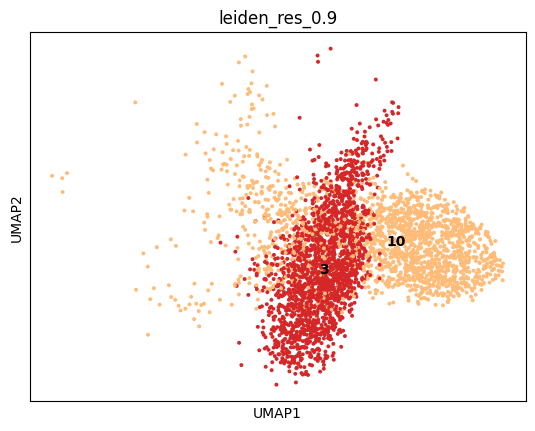

In [4]:
# compare Tfr cluster (3) with eTreg (10) - DEGs
sub_adata = adata[adata.obs["leiden_res_0.9"].isin(["3", "10"])].copy()
sc.pl.umap(sub_adata, color=["leiden_res_0.9"], legend_loc="on data", ncols=1)

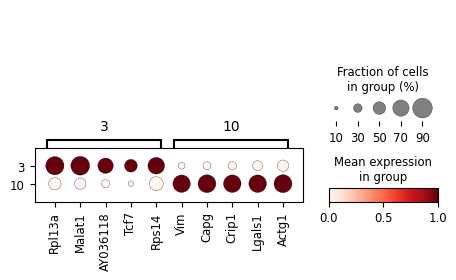

In [5]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(sub_adata, groupby="leiden_res_0.9", method="wilcoxon", layer="data", reference="rest", pts=True)
sc.pl.rank_genes_groups_dotplot(sub_adata, groupby="leiden_res_0.9", standard_scale="var", n_genes=5)

In [6]:
de_tfr_etreg = sc.get.rank_genes_groups_df(sub_adata, group=None)
de_tfr_etreg["pct_diff"] = de_tfr_etreg["pct_nz_group"] - de_tfr_etreg["pct_nz_reference"]
de_tfr_etreg["annot"] = np.where(de_tfr_etreg["group"] == "10", "eTreg",
                       np.where(de_tfr_etreg["group"] == "3", "Tfr", None))
de_tfr_etreg

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff,annot
0,3,Rpl13a,26.181147,1.262030,4.357359e-151,1.811681e-147,0.899322,0.871358,0.027964,Tfr
1,3,Malat1,25.701391,1.155640,1.127787e-145,3.751244e-142,0.968179,0.980759,-0.012579,Tfr
2,3,AY036118,23.555412,1.680736,1.104882e-122,2.826967e-119,0.806468,0.544255,0.262213,Tfr
3,3,Tcf7,23.487268,2.015254,5.503671e-122,1.307594e-118,0.675535,0.289170,0.386365,Tfr
4,3,Rps14,22.230839,0.498633,1.728766e-109,3.194567e-106,0.928534,0.933480,-0.004946,Tfr
...,...,...,...,...,...,...,...,...,...,...
66519,10,Rps14,-22.230839,-0.498633,1.728766e-109,3.194567e-106,0.933480,0.928534,0.004946,eTreg
66520,10,Tcf7,-23.487268,-2.015254,5.503671e-122,1.307594e-118,0.289170,0.675535,-0.386365,eTreg
66521,10,AY036118,-23.555412,-1.680736,1.104882e-122,2.826967e-119,0.544255,0.806468,-0.262213,eTreg
66522,10,Malat1,-25.701391,-1.155640,1.127787e-145,3.751244e-142,0.980759,0.968179,0.012579,eTreg


In [9]:
de_tfr_etreg.sort_values(by="pct_diff", ascending=False).head(10)

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff,annot
33267,10,Emp3,28.284731,2.296252,5.325978e-176,2.952545e-172,0.755360,0.335420,0.419940,eTreg
33263,10,Capg,32.623573,2.500040,1.899817e-233,3.159585e-229,0.819681,0.404278,0.415404,eTreg
33262,10,Vim,35.108200,2.858723,5.053531e-270,1.680905e-265,0.854316,0.448618,0.405698,eTreg
33279,10,Ccr2,20.755522,4.978026,1.092910e-95,1.298299e-92,0.411765,0.022953,0.388812,eTreg
3,3,Tcf7,23.487268,2.015254,5.503671e-122,1.307594e-118,0.675535,0.289170,0.386365,Tfr
33300,10,2010107E04Rik,17.890356,2.031043,1.402083e-71,7.521947e-69,0.462892,0.103286,0.359605,eTreg
5,3,Gas5,22.222584,1.946534,2.077654e-109,3.637207e-106,0.635889,0.283672,0.352217,Tfr
21,3,Tle5,18.273794,1.443388,1.338163e-74,7.808767e-72,0.635889,0.288620,0.347269,Tfr
33306,10,Usmg5,16.994663,1.895960,8.994487e-65,4.213727e-62,0.449148,0.102765,0.346383,eTreg
7,3,2410006H16Rik,22.155367,2.109549,9.260148e-109,1.466719e-105,0.611894,0.269929,0.341965,Tfr


In [10]:
de_tfr_etreg.to_csv("analysis/integration/degs_tfr_etreg_unfilt.csv", index=False)

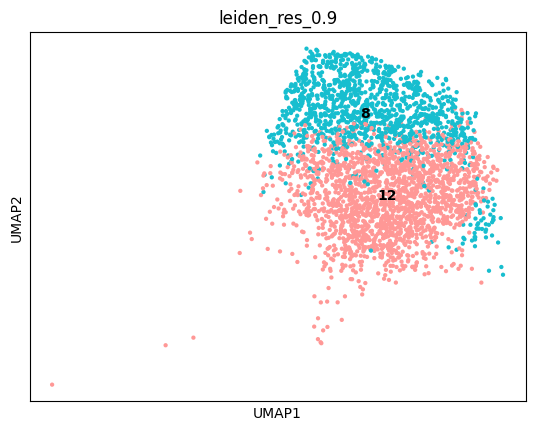

In [20]:
# compare Treg naive clusters (8 and 12) - DEGs
sub_adata = adata[adata.obs["leiden_res_0.9"].isin(["8", "12"])].copy()
sc.pl.umap(sub_adata, color=["leiden_res_0.9"], legend_loc="on data", ncols=1)

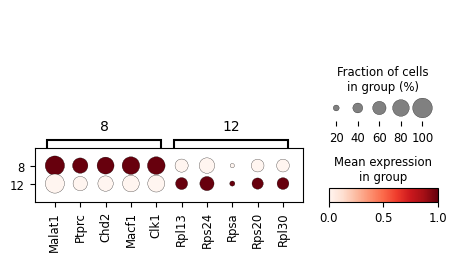

In [21]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(sub_adata, groupby="leiden_res_0.9", method="wilcoxon", layer="data", reference="rest", pts=True)
sc.pl.rank_genes_groups_dotplot(sub_adata, groupby="leiden_res_0.9", standard_scale="var", n_genes=5)

In [22]:
de_ntreg = sc.get.rank_genes_groups_df(sub_adata, group=None)
de_ntreg["pct_diff"] = de_ntreg["pct_nz_group"] - de_ntreg["pct_nz_reference"]
de_ntreg

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
0,8,Malat1,22.028719,0.578112,1.528350e-107,1.129689e-104,1.000000,0.994271,0.005729
1,8,Ptprc,16.996780,0.577380,8.675612e-65,3.652762e-62,0.974673,0.948438,0.026236
2,8,Chd2,14.415535,0.728427,4.132263e-47,1.633627e-44,0.860294,0.820312,0.039982
3,8,Macf1,14.414829,0.648269,4.174683e-47,1.633627e-44,0.875000,0.867708,0.007292
4,8,Clk1,14.218881,0.494855,6.996321e-46,2.705949e-43,0.893791,0.912500,-0.018709
...,...,...,...,...,...,...,...,...,...
66519,12,Clk1,-14.218881,-0.494855,6.996321e-46,2.705949e-43,0.912500,0.893791,0.018709
66520,12,Macf1,-14.414829,-0.648269,4.174683e-47,1.633627e-44,0.867708,0.875000,-0.007292
66521,12,Chd2,-14.415535,-0.728427,4.132263e-47,1.633627e-44,0.820312,0.860294,-0.039982
66522,12,Ptprc,-16.996780,-0.577380,8.675612e-65,3.652762e-62,0.948438,0.974673,-0.026236


In [26]:
de_ntreg[de_ntreg["group"] == "12"].sort_values(by="pct_diff", ascending=False).head(10)

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
33354,12,Snrpf,10.527700,0.606708,6.438840e-26,1.946988e-23,0.800000,0.618464,0.181536
33370,12,Gm11808,8.783781,0.571540,1.580686e-18,3.552486e-16,0.763542,0.584150,0.179391
33366,12,Sec61b,9.174773,0.540512,4.525267e-20,1.075139e-17,0.748958,0.579248,0.169710
33347,12,Nme2,12.532240,0.663702,4.973801e-36,1.759985e-33,0.887500,0.718137,0.169363
33359,12,Sec61g,9.817702,0.584358,9.447249e-23,2.513875e-20,0.775521,0.607026,0.168495
33387,12,Igfbp4,7.597953,0.719325,3.008514e-14,5.458896e-12,0.441146,0.276961,0.164185
33363,12,Eif3k,9.301538,0.507891,1.384292e-20,3.410689e-18,0.817708,0.653595,0.164114
33390,12,Krtcap2,7.349904,0.507250,1.983493e-13,3.436195e-11,0.595833,0.436275,0.159559
33355,12,Hspe1,10.389472,0.607596,2.768815e-25,8.166117e-23,0.767188,0.608660,0.158527
33345,12,Gm10076,13.180810,0.678352,1.131697e-39,4.136538e-37,0.855729,0.697712,0.158017


In [28]:
de_ntreg.to_csv("analysis/integration/degs_naive_treg_unfilt.csv", index=False)

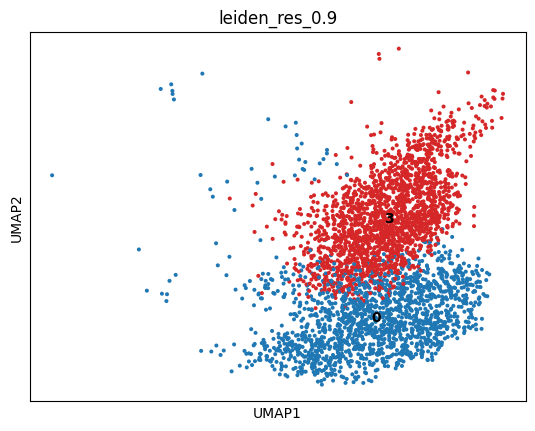

In [30]:
# compare Tfh-fol cluster (0) with Tfr-fol cluster (3) - DEGs
sub_adata = adata[adata.obs["leiden_res_0.9"].isin(["0", "3"])].copy()
sc.pl.umap(sub_adata, color=["leiden_res_0.9"], legend_loc="on data", ncols=1)

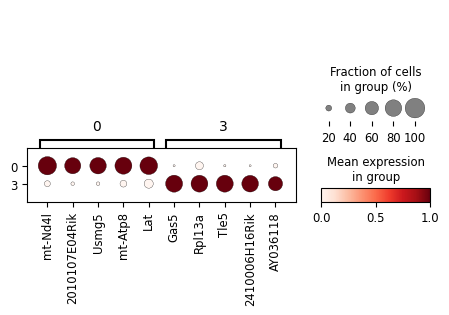

In [31]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(sub_adata, groupby="leiden_res_0.9", method="wilcoxon", layer="data", reference="rest", pts=True)
sc.pl.rank_genes_groups_dotplot(sub_adata, groupby="leiden_res_0.9", standard_scale="var", n_genes=5)

In [33]:
de_fol= sc.get.rank_genes_groups_df(sub_adata, group=None)
de_fol["pct_diff"] = de_fol["pct_nz_group"] - de_fol["pct_nz_reference"]
de_fol["annot"] = np.where(de_fol["group"] == "0", "Tfh_fol",
                       np.where(de_fol["group"] == "3", "Tfr_fol", None))

In [34]:
de_fol[de_fol["group"] == "3"].sort_values(by="pct_diff", ascending=False).head(10)

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff,annot
33262,3,Gas5,31.060535,4.795456,8.222457e-212,5.469907e-208,0.635889,0.043531,0.592359,Tfr_fol
33264,3,Tle5,30.726795,4.462735,2.497142e-207,1.038249e-203,0.635889,0.043531,0.592359,Tfr_fol
33265,3,2410006H16Rik,30.320925,5.263938,6.075298e-202,2.245295e-198,0.611894,0.041717,0.570177,Tfr_fol
33271,3,Ndufb1-ps,26.759539,4.035125,9.563105e-158,1.272352e-154,0.562337,0.043531,0.518806,Tfr_fol
33274,3,Atp5mpl,25.495184,3.859814,2.229201e-143,2.317115e-140,0.539906,0.042926,0.496980,Tfr_fol
33269,3,Rnaset2a,27.768047,3.389255,1.055153e-169,1.847184e-166,0.622848,0.128779,0.494069,Tfr_fol
33273,3,Tut4,25.937853,5.508450,2.493041e-148,2.961554e-145,0.521127,0.028416,0.492711,Tfr_fol
33277,3,Atp5md,25.160990,3.926766,1.071405e-139,9.631645e-137,0.531038,0.042926,0.488112,Tfr_fol
33280,3,Micos10,24.744638,3.579224,3.541024e-135,2.804322e-132,0.531560,0.043531,0.488029,Tfr_fol
33278,3,Tmem134,24.938101,4.042674,2.874654e-137,2.516230e-134,0.522692,0.042926,0.479765,Tfr_fol


In [35]:
de_fol.to_csv("analysis/integration/degs_tfr_tfh_fol_unfilt.csv", index=False)

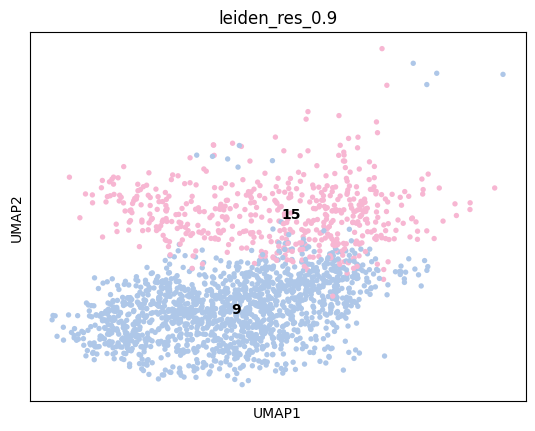

In [37]:
# compare Tfh-GC cluster (9) with Tfr-GC cluster (15) - DEGs
sub_adata = adata[adata.obs["leiden_res_0.9"].isin(["9", "15"])].copy()
sc.pl.umap(sub_adata, color=["leiden_res_0.9"], legend_loc="on data", ncols=1)

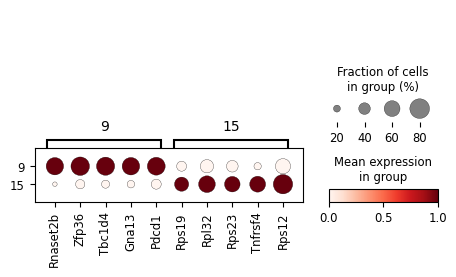

In [38]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(sub_adata, groupby="leiden_res_0.9", method="wilcoxon", layer="data", reference="rest", pts=True)
sc.pl.rank_genes_groups_dotplot(sub_adata, groupby="leiden_res_0.9", standard_scale="var", n_genes=5)

In [39]:
de_gc= sc.get.rank_genes_groups_df(sub_adata, group=None)
de_gc["pct_diff"] = de_gc["pct_nz_group"] - de_gc["pct_nz_reference"]
de_gc["annot"] = np.where(de_gc["group"] == "9", "Tfh_GC",
                       np.where(de_gc["group"] == "15", "Tfr_GC", None))

In [40]:
de_gc[de_gc["group"] == "15"].sort_values(by="pct_diff", ascending=False).head(10)

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff,annot
33269,15,Gas5,14.668891,3.469466,1.019980e-48,1.256540e-45,0.495127,0.065276,0.429851,Tfr_GC
33271,15,Tle5,14.413342,3.214654,4.265625e-47,4.729441e-44,0.491228,0.065949,0.425279,Tfr_GC
33278,15,Atp5mpl,13.993842,3.089235,1.699743e-44,1.378948e-41,0.481481,0.065276,0.416206,Tfr_GC
33281,15,Micos10,13.866401,2.975010,1.012309e-43,7.652595e-41,0.479532,0.063930,0.415602,Tfr_GC
33275,15,Atp5o,14.108687,3.253137,3.357717e-45,3.018497e-42,0.475634,0.060565,0.415068,Tfr_GC
33276,15,2410006H16Rik,14.072225,3.346426,5.627135e-45,4.925520e-42,0.475634,0.061911,0.413722,Tfr_GC
33280,15,Atp5md,13.944649,3.245555,3.391125e-44,2.623153e-41,0.471735,0.059892,0.411843,Tfr_GC
33284,15,Ndufb1-ps,13.612625,3.092610,3.369212e-42,2.384399e-39,0.467836,0.062584,0.405252,Tfr_GC
33285,15,Micos13,13.578735,3.076027,5.354312e-42,3.710315e-39,0.463938,0.061911,0.402026,Tfr_GC
33286,15,Tmem134,13.438118,3.080091,3.615122e-41,2.357769e-38,0.458090,0.059892,0.398197,Tfr_GC


In [41]:
de_gc.to_csv("analysis/integration/degs_tfr_tfh_gc_unfilt.csv", index=False)

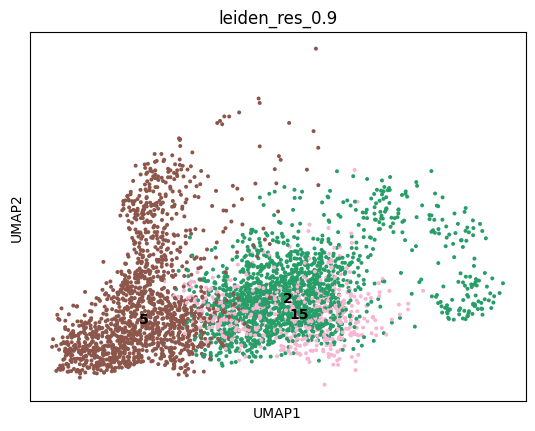

In [42]:
# compare Il1r2 clusters (15, 2 and 5) - DEGs
sub_adata = adata[adata.obs["leiden_res_0.9"].isin(["15", "2", "5"])].copy()
sc.pl.umap(sub_adata, color=["leiden_res_0.9"], legend_loc="on data", ncols=1)

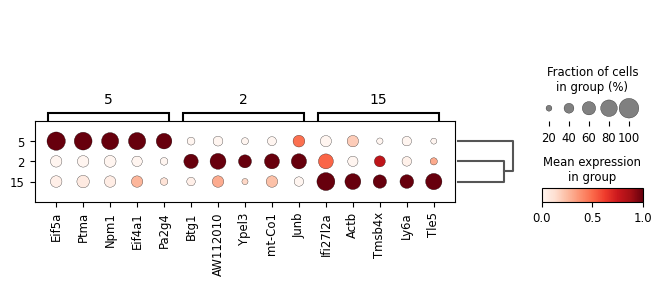

In [43]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(sub_adata, groupby="leiden_res_0.9", method="wilcoxon", layer="data", reference="rest", pts=True)
sc.pl.rank_genes_groups_dotplot(sub_adata, groupby="leiden_res_0.9", standard_scale="var", n_genes=5)

In [44]:
de_Il1r2 = sc.get.rank_genes_groups_df(sub_adata, group=None)
de_Il1r2["pct_diff"] = de_Il1r2["pct_nz_group"] - de_Il1r2["pct_nz_reference"]
de_Il1r2.to_csv("analysis/integration/degs_Il1r2_clusters_unfilt.csv", index=False)

In [45]:
de_Il1r2.sort_values(by="pct_diff", ascending=False).head(10)

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
33270,5,Srm,25.197485,3.308460,4.268220e-140,1.577439e-136,0.570937,0.099545,0.471391
33268,5,C1qbp,26.797066,2.353598,3.495964e-158,1.661182e-154,0.698347,0.262727,0.435620
33266,5,Pa2g4,26.855814,2.044317,7.213814e-159,4.798918e-155,0.761708,0.349545,0.412163
33280,5,Mrto4,22.135990,2.385597,1.423533e-108,2.492082e-105,0.564050,0.165909,0.398140
33275,5,Nop58,23.647160,2.084327,1.262473e-123,2.999455e-120,0.663912,0.270455,0.393457
33290,5,Ppan,20.667053,2.566035,6.857728e-95,7.865578e-92,0.514463,0.126364,0.388099
33284,5,Mybbp1a,21.281090,2.437640,1.699440e-100,2.457685e-97,0.546832,0.165000,0.381832
33271,5,Fbl,25.099949,1.765717,4.979599e-139,1.656314e-135,0.760331,0.391364,0.368967
33288,5,Phb,20.816105,1.898118,3.093299e-96,3.810715e-93,0.603994,0.237273,0.366722
33272,5,Hspd1,25.030972,2.104730,2.813634e-138,8.507916e-135,0.709366,0.343636,0.365730


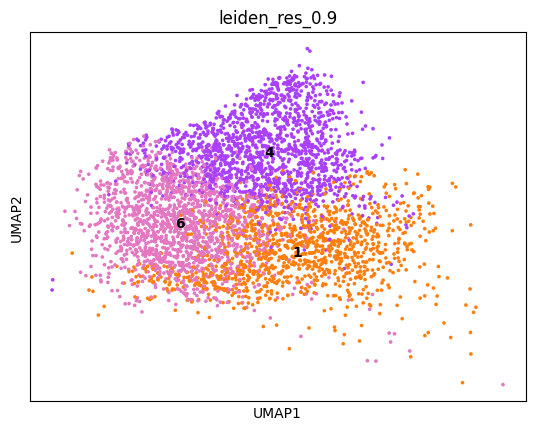

In [48]:
# compare Treg clusters 7 and 11 - DEGs
sub_adata = adata[adata.obs["leiden_res_0.9"].isin(["1", "4", "6"])].copy()
sc.pl.umap(sub_adata, color=["leiden_res_0.9"], legend_loc="on data", ncols=1)

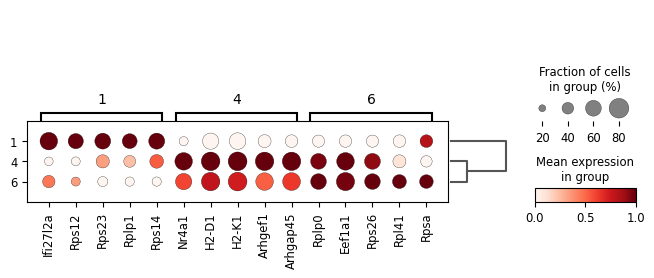

In [49]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(sub_adata, groupby="leiden_res_0.9", method="wilcoxon", layer="data", reference="rest", pts=True)
sc.pl.rank_genes_groups_dotplot(sub_adata, groupby="leiden_res_0.9", standard_scale="var", n_genes=5)

In [50]:
de_treg = sc.get.rank_genes_groups_df(sub_adata, group=None)
de_treg["pct_diff"] = de_treg["pct_nz_group"] - de_treg["pct_nz_reference"]
de_treg.to_csv("analysis/integration/degs_MAtreg_unfilt.csv", index=False)

In [56]:
de_treg[(de_treg["group"] == "6") & (abs(de_treg["pvals_adj"]) < 0.05)
        & (abs(de_treg["pct_diff"]) > 0.1)].sort_values(by="logfoldchanges", ascending=False).head(20)

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
66561,6,Gm9493,11.617315,0.865803,3.365475e-31,2.798561e-28,0.513699,0.265329,0.248370
66582,6,Minos1,9.842216,0.864084,7.406165e-23,4.038424e-20,0.379203,0.174285,0.204918
66737,6,Gm10073,5.891098,0.833334,3.836375e-09,5.722220e-07,0.210461,0.094389,0.116072
66781,6,Srm,5.561374,0.820022,2.676597e-08,3.285201e-06,0.211706,0.106652,0.105054
66546,6,2010107E04Rik,13.408212,0.813619,5.412865e-41,7.501779e-38,0.768369,0.471200,0.297168
66664,6,Rpl27-ps3,6.824138,0.789628,8.845458e-12,2.015189e-09,0.257783,0.121516,0.136267
66595,6,Igfbp4,9.284028,0.773376,1.631895e-20,7.335146e-18,0.486924,0.308064,0.178860
66651,6,Nutf2,7.138626,0.761518,9.426880e-13,2.393564e-10,0.280199,0.135637,0.144562
66663,6,Fam96a,6.845870,0.759452,7.601243e-12,1.743673e-09,0.261519,0.124117,0.137402
66687,6,Phgdh,6.539097,0.717789,6.189132e-11,1.209824e-08,0.295143,0.172055,0.123088


In [57]:
de_treg[(de_treg["group"] == "1") & (abs(de_treg["pvals_adj"]) < 0.05)
        & (abs(de_treg["pct_diff"]) > 0.1)].sort_values(by="logfoldchanges", ascending=False).head(20)

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
19,1,Resf1,9.282619,3.177567,1.653616e-20,5.612507e-18,0.216777,0.037827,0.178950
60,1,Plaat3,5.883381,3.035263,4.019694e-09,3.594168e-07,0.142027,0.029098,0.112929
25,1,2410006H16Rik,8.886166,3.021258,6.325389e-19,1.845571e-16,0.211794,0.040737,0.171057
16,1,Gas5,10.393042,2.957334,2.667098e-25,1.584161e-22,0.243355,0.042030,0.201325
33,1,Tut4,7.965127,2.852211,1.650540e-15,3.431267e-13,0.192691,0.039444,0.153247
41,1,Zfas1,7.242384,2.680549,4.408663e-13,6.949808e-11,0.178571,0.038474,0.140097
45,1,Tmem134,6.899063,2.632982,5.234658e-12,6.992579e-10,0.168605,0.035241,0.133364
27,1,Atp5mpl,8.647332,2.627861,5.271724e-18,1.425594e-15,0.208472,0.039767,0.168705
61,1,Tut7,5.721708,2.552774,1.054585e-08,8.835667e-07,0.143688,0.032978,0.110710
36,1,1810026B05Rik,7.588511,2.549712,3.236028e-14,6.081173e-12,0.186047,0.038474,0.147573


In [58]:
de_treg[(de_treg["group"] == "4") & (abs(de_treg["pvals_adj"]) < 0.05)
        & (abs(de_treg["pct_diff"]) > 0.1)].sort_values(by="logfoldchanges", ascending=False).head(20)

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
33262,4,Nr4a1,15.818956,1.130583,2.302763e-56,3.330196e-53,0.703430,0.517438,0.185992
33330,4,Bach2,6.558782,1.116029,5.424924e-11,1.087011e-08,0.296570,0.196441,0.100129
33284,4,Rasgrp2,9.514791,0.896706,1.820785e-21,6.308642e-19,0.474781,0.341281,0.133500
33283,4,Tsc22d3,9.788251,0.870706,1.264648e-22,4.474970e-20,0.515804,0.400000,0.115804
33282,4,Satb1,9.879524,0.863311,5.107463e-23,1.826714e-20,0.509751,0.383274,0.126477
33273,4,S1pr1,11.376238,0.835744,5.491813e-30,2.572798e-27,0.611970,0.485765,0.126205
33298,4,Gm2682,8.232588,0.786521,1.832112e-16,5.164381e-14,0.473436,0.365480,0.107956
33323,4,Ly6c1,7.003790,0.766605,2.491293e-12,5.380870e-10,0.412239,0.304270,0.107969
33292,4,Dusp2,8.616592,0.676445,6.897610e-18,2.085712e-15,0.591123,0.489680,0.101443
66387,4,Aldoa,-4.479503,-0.305641,7.481718e-06,8.464520e-04,0.501009,0.601068,-0.100059


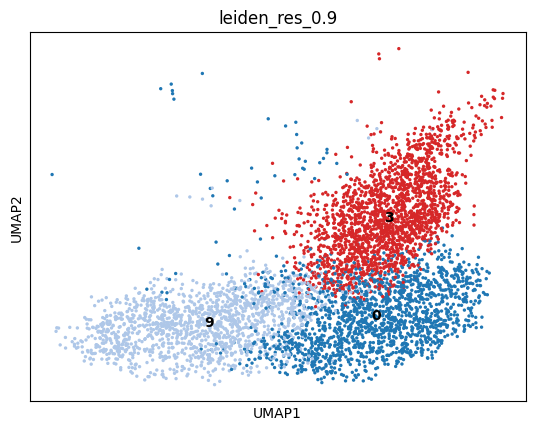

In [59]:
# compare Tfh clusters (0 and 9) with Tfr cluster 3 - DEGs
sub_adata = adata[adata.obs["leiden_res_0.9"].isin(["0", "9", "3"])].copy()
sc.pl.umap(sub_adata, color=["leiden_res_0.9"], legend_loc="on data", ncols=1)

In [60]:
sub_adata.obs["comparison_annot"] = sub_adata.obs["leiden_res_0.9"].map(
    {
        "0": "Tfh",
        "3": "Tfr_c3",
        "9": "Tfh"
    }
)

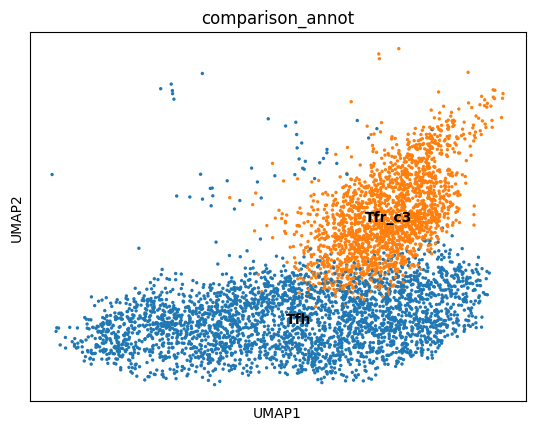

In [61]:
sc.pl.umap(sub_adata, color=["comparison_annot"], legend_loc="on data", ncols=1)

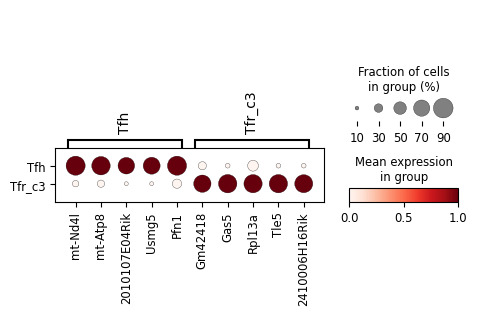

In [63]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(sub_adata, groupby="comparison_annot", method="wilcoxon", layer="data", reference="rest", pts=True)
sc.pl.rank_genes_groups_dotplot(sub_adata, groupby="comparison_annot", standard_scale="var", n_genes=5)

In [64]:
de_tfr_tfh = sc.get.rank_genes_groups_df(sub_adata, group=None)
de_tfr_tfh["pct_diff"] = de_tfr_tfh["pct_nz_group"] - de_tfr_tfh["pct_nz_reference"]
de_tfr_tfh

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
0,Tfh,mt-Nd4l,38.866840,2.846447,0.000000e+00,0.000000e+00,0.969108,0.587898,0.381211
1,Tfh,mt-Atp8,37.067398,2.514601,9.420423e-301,1.566711e-296,0.929618,0.483568,0.446050
2,Tfh,2010107E04Rik,34.315014,2.886471,4.686527e-258,1.948541e-254,0.711465,0.103286,0.608179
3,Tfh,Usmg5,33.960529,2.823198,8.528774e-253,3.152045e-249,0.711465,0.102765,0.608700
4,Tfh,Pfn1,33.809090,1.003247,1.450072e-250,4.823229e-247,0.976115,0.968179,0.007935
...,...,...,...,...,...,...,...,...,...
66519,Tfr_c3,Pfn1,-33.809090,-1.003247,1.450072e-250,4.823229e-247,0.968179,0.976115,-0.007935
66520,Tfr_c3,Usmg5,-33.960529,-2.823198,8.528774e-253,3.152045e-249,0.102765,0.711465,-0.608700
66521,Tfr_c3,2010107E04Rik,-34.315014,-2.886471,4.686527e-258,1.948541e-254,0.103286,0.711465,-0.608179
66522,Tfr_c3,mt-Atp8,-37.067398,-2.514601,9.420423e-301,1.566711e-296,0.483568,0.929618,-0.446050


In [65]:
de_tfr_tfh.to_csv("analysis/integration/degs_tfr_tfh_unfilt.csv", index=False)

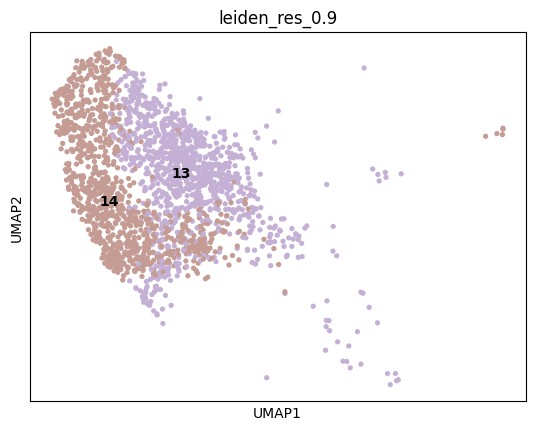

In [4]:
# compare Tfh clusters (0 and 9) with Tfr cluster 3 - DEGs
sub_adata = adata[adata.obs["leiden_res_0.9"].isin(["14", "13"])].copy()
sc.pl.umap(sub_adata, color=["leiden_res_0.9"], legend_loc="on data", ncols=1)

In [49]:
df = sc.get.rank_genes_groups_df(adata, group="6")
df["pct_diff"] = df["pct_nz_group"] - df["pct_nz_reference"]
c6_df = df[(df["pvals"] < 0.05) & (abs(df["pct_diff"]) > 0.1)]
c6_df.sort_values(by="logfoldchanges", ascending=False).head(30)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
58,Igfbp4,24.350937,2.471365,5.666274e-131,3.089699e-128,0.486924,0.138277,0.348647
101,Ctsw,14.808891,1.787306,1.283404e-49,2.635098e-47,0.333748,0.120362,0.213386
64,Gm9493,21.533667,1.632167,7.533248e-103,3.386093e-100,0.513699,0.205049,0.308650
122,Rpl13a-ps1,12.523448,1.605713,5.556760e-36,7.968888e-34,0.290785,0.106774,0.184011
27,Gm11808,34.947269,1.473069,1.424655e-267,1.692388e-264,0.985056,0.818362,0.166694
116,Ly6c1,13.206783,1.434428,8.017779e-40,1.282151e-37,0.353051,0.161840,0.191211
86,2810474O19Rik,16.204737,1.367339,4.668869e-59,1.176484e-56,0.420299,0.177719,0.242580
85,Fam105a,16.471960,1.363964,5.834832e-61,1.540303e-58,0.421544,0.176752,0.244792
170,Slc17a9,8.918019,1.330075,4.747014e-19,2.804533e-17,0.244085,0.118327,0.125758
217,Rcn1,7.294506,1.310088,2.997576e-13,1.084933e-11,0.217933,0.117716,0.100217


In [50]:
df = sc.get.rank_genes_groups_df(adata, group="4")
df["pct_diff"] = df["pct_nz_group"] - df["pct_nz_reference"]
c4_df = df[(df["pvals"] < 0.05) & (abs(df["pct_diff"]) > 0.1)]
c4_df.sort_values(by="logfoldchanges", ascending=False).head(30)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
156,Gm45552,6.623415,2.235120,3.509951e-11,8.244914e-10,0.143914,0.043859,0.100055
32,Ly6c1,17.873146,2.102753,1.909164e-71,1.154593e-68,0.412239,0.158539,0.253700
44,Igfbp4,15.487571,1.910686,4.208979e-54,1.555545e-51,0.373235,0.148928,0.224307
86,Ctsw,11.118457,1.773675,1.020214e-28,1.112602e-26,0.283793,0.125405,0.158388
46,Fam105a,15.305788,1.713809,6.994953e-53,2.350163e-50,0.388702,0.180696,0.208006
4,Nr4a1,24.715048,1.628376,7.369540e-135,2.451257e-131,0.703430,0.460694,0.242736
125,Slc17a9,8.341574,1.616666,7.330854e-17,3.166739e-15,0.236046,0.119688,0.116357
1,Klf2,27.154343,1.558675,2.249984e-162,1.870974e-158,0.807666,0.517705,0.289961
100,Ecm1,10.257241,1.480020,1.097992e-24,8.951327e-23,0.327505,0.200425,0.127080
43,Rasgrp2,15.560371,1.441923,1.353122e-54,5.114493e-52,0.474781,0.300941,0.173841


In [55]:
df = sc.get.rank_genes_groups_df(adata, group="1")
df["pct_diff"] = df["pct_nz_group"] - df["pct_nz_reference"]
c1_df = df[(df["pvals"] < 0.05) & (abs(df["pct_diff"]) > 0.1)]
c1_df.sort_values(by="logfoldchanges", ascending=False).head(30)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
27271,Bola2,-2.442216,0.019990,1.459742e-02,0.079714,0.397841,0.498379,-0.100539
28480,Cirbp,-3.318756,0.005725,9.041943e-04,0.006169,0.363787,0.472695,-0.108907
27462,Clec2d,-2.568800,-0.001213,1.020513e-02,0.057533,0.419435,0.523116,-0.103681
29600,Adh5,-4.319678,-0.008377,1.562573e-05,0.000139,0.224252,0.326617,-0.102365
27889,Trmt112,-2.866490,-0.019604,4.150515e-03,0.025238,0.450997,0.568051,-0.117055
27404,Epsti1,-2.528844,-0.019631,1.144387e-02,0.063888,0.401163,0.501471,-0.100308
29161,Eif4b,-3.918253,-0.019676,8.919313e-05,0.000708,0.342193,0.463219,-0.121026
26993,Dgka,-2.259575,-0.021604,2.384765e-02,0.124505,0.511628,0.630243,-0.118615
29469,Hypk,-4.200369,-0.023133,2.664806e-05,0.000228,0.289037,0.399232,-0.110195
29256,Casp8,-4.016647,-0.023989,5.903207e-05,0.000480,0.295681,0.404718,-0.109037


In [48]:
df = sc.get.rank_genes_groups_df(adata, group="12")
df["pct_diff"] = df["pct_nz_group"] - df["pct_nz_reference"]
c12_df = df[(df["pvals"] < 0.05) & (abs(df["pct_diff"]) > 0.1)]
c12_df.sort_values(by="logfoldchanges", ascending=False).head(30)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
1254,Slc49a4,8.184667,2.818467,2.730583e-16,5.001358e-15,0.133854,0.021360,0.112494
14,Resf1,44.533882,2.762728,0.000000e+00,0.000000e+00,0.782292,0.226377,0.555915
989,Fbxl22,10.215962,2.713940,1.682015e-24,4.016308e-23,0.166667,0.026015,0.140652
11,1810026B05Rik,45.701542,2.666005,0.000000e+00,0.000000e+00,0.792188,0.226998,0.565190
6,AY036118,50.138245,2.609975,0.000000e+00,0.000000e+00,0.939063,0.573364,0.365698
1406,Sorcs2,7.383614,2.579837,1.540503e-13,2.486183e-12,0.117708,0.015102,0.102606
29,Snhg1,39.974876,2.578632,0.000000e+00,0.000000e+00,0.700521,0.188777,0.511744
1036,Gm50240,9.771420,2.483450,1.493435e-22,3.370057e-21,0.168229,0.034032,0.134198
977,Znrf3,10.332900,2.475369,5.002501e-25,1.211895e-23,0.174479,0.031911,0.142568
233,Tasor2,22.066423,2.397364,6.644307e-108,7.175420e-106,0.392188,0.097336,0.294851


In [46]:
df = sc.get.rank_genes_groups_df(adata, group="8")
df["pct_diff"] = df["pct_nz_group"] - df["pct_nz_reference"]
c8_df = df[(df["pvals"] < 0.05) & (abs(df["pct_diff"]) > 0.1)]
c8_df.sort_values(by="logfoldchanges", ascending=False).head(20)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
1325,Gm4258,6.411790,2.866228,1.438208e-10,2.209592e-09,0.132353,0.024462,0.107891
358,Irs2,15.788433,2.722657,3.737480e-56,2.386105e-54,0.328431,0.065498,0.262933
1,Vps37b,39.790562,2.717754,0.000000e+00,0.000000e+00,0.870098,0.450352,0.419746
1090,Fbxl22,7.797710,2.642135,6.304074e-15,1.211358e-13,0.162582,0.031152,0.131430
1105,Gm10125,7.702425,2.640873,1.335074e-14,2.518845e-13,0.165850,0.037642,0.128208
1276,Arhgap20,6.675467,2.622704,2.464467e-11,3.931563e-10,0.138072,0.024911,0.113161
6,Satb1,37.310474,2.621493,1.109999e-304,3.692080e-301,0.828431,0.395737,0.432695
1046,Gm50240,8.048193,2.565129,8.402542e-16,1.679600e-14,0.173203,0.038390,0.134812
22,Resf1,31.637783,2.558650,1.116628e-219,1.160665e-216,0.718137,0.249613,0.468524
178,Ddx3y,20.832119,2.556672,2.214483e-96,2.888554e-94,0.453431,0.118516,0.334915


In [44]:
df = sc.get.rank_genes_groups_df(adata, group="7")
df["pct_diff"] = df["pct_nz_group"] - df["pct_nz_reference"]
c7_df = df[(df["pvals"] < 0.05) & (abs(df["pct_diff"]) > 0.1)]
c7_df.sort_values(by="logfoldchanges", ascending=False).head(20)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
314,Zbtb10,8.539956,3.068312,1.342734e-17,1.122161e-15,0.280374,0.041869,0.238505
1164,Ell2,5.162947,2.783047,2.430919e-07,5.971731e-06,0.177570,0.033610,0.143960
1937,Il1rl1,3.744076,2.780631,1.810586e-04,2.726288e-03,0.128505,0.023479,0.105026
2061,Gm29112,3.579978,2.616457,3.436226e-04,4.878180e-03,0.126168,0.025928,0.100240
616,A930006K02Rik,6.862280,2.570701,6.776985e-12,3.033864e-10,0.247664,0.059826,0.187837
39,Dennd4a,13.403727,2.557731,5.750206e-41,3.084893e-38,0.502336,0.151630,0.350706
769,Itgb8,6.254342,2.528092,3.991955e-10,1.451787e-08,0.226636,0.052912,0.173723
2054,Trmt61b,3.584284,2.526303,3.380045e-04,4.812802e-03,0.123832,0.022471,0.101361
1237,Spock2,5.016489,2.488137,5.262446e-07,1.222343e-05,0.177570,0.037355,0.140215
159,Klf4,10.205180,2.455683,1.879719e-24,2.803732e-22,0.390187,0.112258,0.277929


In [45]:
df = sc.get.rank_genes_groups_df(adata, group="11")
df["pct_diff"] = df["pct_nz_group"] - df["pct_nz_reference"]
c11_df = df[(df["pvals"] < 0.05) & (abs(df["pct_diff"]) > 0.1)]
c11_df.sort_values(by="logfoldchanges", ascending=False).head(20)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
39,Tgtp1,12.190918,2.783891,3.474867e-34,2.687931e-31,0.346970,0.077495,0.269475
2,Ifit1,20.998060,2.733573,6.831755e-98,7.574594e-94,0.628788,0.220733,0.408055
93,Cmpk2,8.650288,2.616769,5.136968e-18,1.498823e-15,0.256061,0.065453,0.190608
122,Gbp10,7.522693,2.607188,5.365936e-14,1.101739e-11,0.218182,0.049429,0.168752
72,Rsad2,9.435045,2.539084,3.908248e-21,1.511583e-18,0.289394,0.085603,0.203791
8,Ifit3,18.026173,2.441896,1.214124e-72,4.487131e-69,0.572727,0.204710,0.368017
207,Oasl1,5.249001,2.436813,1.529267e-07,1.284507e-05,0.159091,0.042000,0.117090
35,Ifit1bl1,13.195584,2.411735,9.303023e-40,8.595477e-37,0.410606,0.135664,0.274942
60,Oasl2,10.202387,2.318166,1.934595e-24,9.463016e-22,0.321212,0.100461,0.220751
23,Gbp2,14.987722,2.307342,8.833040e-51,1.224186e-47,0.487879,0.185870,0.302008


In [37]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden_res_0.9", method="wilcoxon", layer="data", groups=["15"], reference="3", pts=True)

In [38]:
df_gc_tfr = sc.get.rank_genes_groups_df(adata, group="15")
filtered_df_gc_tfr = df_gc_tfr[df_gc_tfr["pvals"] < 0.05]
filtered_df_gc_tfr.sort_values(by="logfoldchanges", ascending=False).head(20)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group
337,Mettl1,2.971477,3.407846,2.963711e-03,8.770371e-02,0.097466
382,Smyd5,2.821456,2.483809,4.780619e-03,1.305319e-01,0.097466
218,Egr3,3.606630,2.341381,3.101990e-04,1.244613e-02,0.132554
61,Apex1,6.132048,2.257321,8.675517e-10,1.114151e-07,0.230019
104,Il1r2,4.777998,2.229198,1.770491e-06,1.258335e-04,0.194932
85,Nop16,5.346306,2.161383,8.976724e-08,8.158027e-06,0.196881
37,Marcksl1,7.258710,2.061762,3.907995e-13,9.026925e-11,0.317739
580,Ipo4,2.270931,1.959923,2.315118e-02,4.551150e-01,0.083821
182,Srm,3.778508,1.916234,1.577708e-04,6.904963e-03,0.152047
133,Tsr1,4.356381,1.902357,1.322307e-05,7.635861e-04,0.171540


In [39]:
filtered_df = df_gc_tfr[(df_gc_tfr["pvals"] < 0.05) & (df_gc_tfr["pct_nz_group"] > 0.5)]
filtered_df.sort_values(by="logfoldchanges", ascending=False).head(20)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group
6,Tnfrsf4,11.902593,1.549593,1.147268e-32,3.180036e-29,0.688109
5,Mif,11.933234,1.377586,7.942643e-33,2.401711e-29,0.713450
19,Nme1,9.023997,1.282907,1.813483e-19,1.138114e-16,0.575049
44,Rilpl2,6.806805,1.151195,9.978995e-12,1.794169e-09,0.528265
15,Ran,9.546254,1.114798,1.344702e-21,1.177039e-18,0.662768
41,Cycs,7.087931,1.031549,1.361323e-12,2.884097e-10,0.528265
25,Atp5g1,8.455299,1.025265,2.783720e-17,1.157401e-14,0.615984
13,Eif4a1,9.577604,1.003218,9.932157e-22,9.438954e-19,0.697856
21,Eif5a,8.862499,0.891069,7.824043e-19,4.337389e-16,0.717349
18,Psme2,9.179049,0.888364,4.349170e-20,3.077917e-17,0.723197


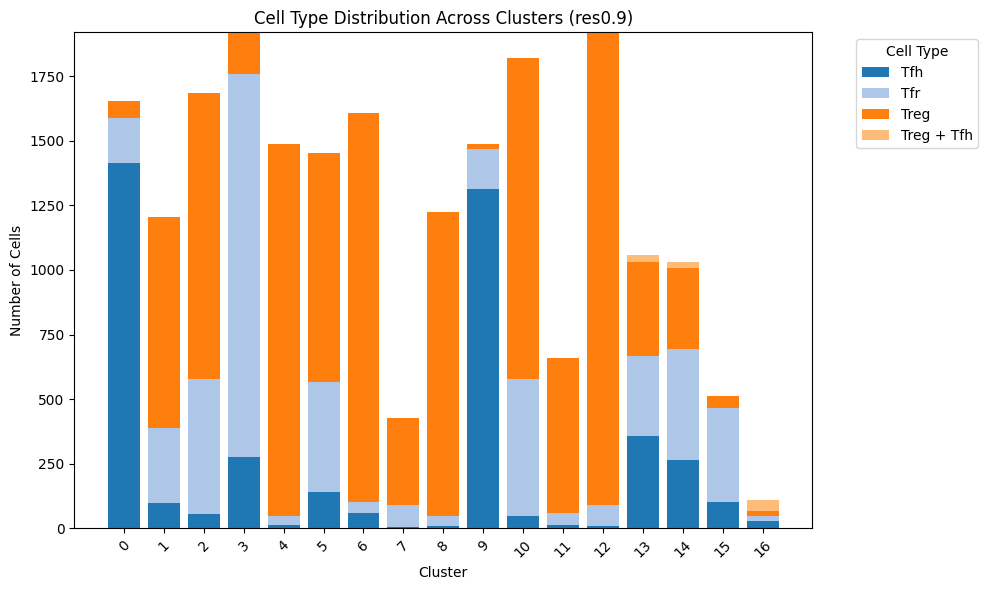

In [22]:
# Step 1: Count cells per cluster and cell type
counts_df = (
    adata.obs[['leiden_res_0.9', 'cell_type']]
    .groupby(['leiden_res_0.9', 'cell_type'])
    .size()
    .reset_index(name='count')
)

# Step 2: Pivot to wide format (clusters as rows, cell types as columns)
pivot_df = counts_df.pivot_table(
    index='leiden_res_0.9',
    columns='cell_type',
    values='count',
    fill_value=0
)

# Step 3: Plot stacked bar chart with cell type colors
fig, ax = plt.subplots(figsize=(10, 6))

bottom = pd.Series(0, index=pivot_df.index)
colors = plt.get_cmap('tab20').colors  # You can customize the colormap
cell_types = pivot_df.columns

for i, cell_type in enumerate(cell_types):
    ax.bar(
        pivot_df.index,
        pivot_df[cell_type],
        bottom=bottom,
        label=cell_type,
        color=colors[i % len(colors)]
    )
    bottom += pivot_df[cell_type]

ax.set_ylabel("Number of Cells")
ax.set_xlabel("Cluster")
ax.set_title("Cell Type Distribution Across Clusters (res0.9)")
ax.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

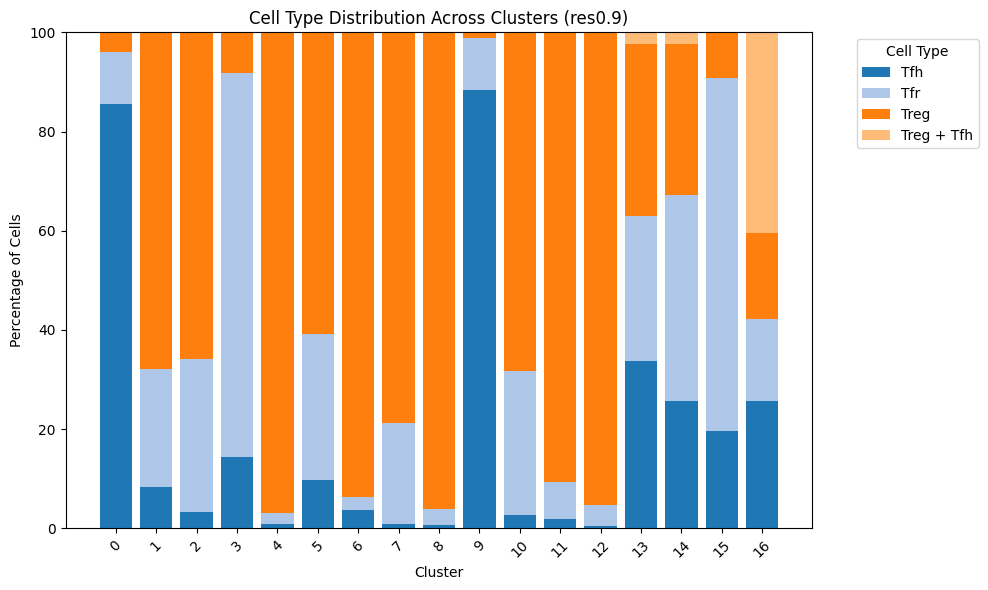

In [23]:
# Step 1: Count cells per cluster and cell type
counts_df = (
    adata.obs[['leiden_res_0.9', 'cell_type']]
    .groupby(['leiden_res_0.9', 'cell_type'])
    .size()
    .reset_index(name='count')
)

# Step 2: Pivot to wide format (clusters as rows, cell types as columns)
pivot_df = counts_df.pivot_table(
    index='leiden_res_0.9',
    columns='cell_type',
    values='count',
    fill_value=0
)

# Step 3: Normalize to percentages so each cluster sums to 100%
percentage_df = pivot_df.div(pivot_df.sum(axis=1), axis=0) * 100

# Step 4: Plot using matplotlib (true stacked percentage bar plot)
fig, ax = plt.subplots(figsize=(10, 6))

bottom = pd.Series([0] * percentage_df.shape[0], index=percentage_df.index)
colors = plt.get_cmap('tab20').colors  # You can choose another colormap
cell_types = percentage_df.columns

for i, cell_type in enumerate(cell_types):
    ax.bar(
        percentage_df.index,
        percentage_df[cell_type],
        bottom=bottom,
        label=cell_type,
        color=colors[i % len(colors)]
    )
    bottom += percentage_df[cell_type]

ax.set_ylabel("Percentage of Cells")
ax.set_xlabel("Cluster")
ax.set_title("Cell Type Distribution Across Clusters (res0.9)")
ax.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

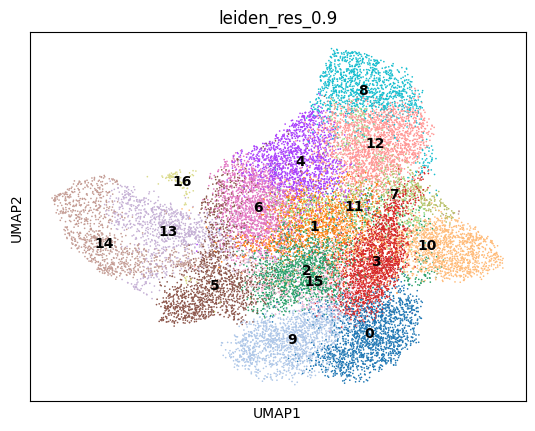

In [10]:
sc.pl.umap(adata, color=["leiden_res_0.9"], legend_loc="on data", ncols=1)

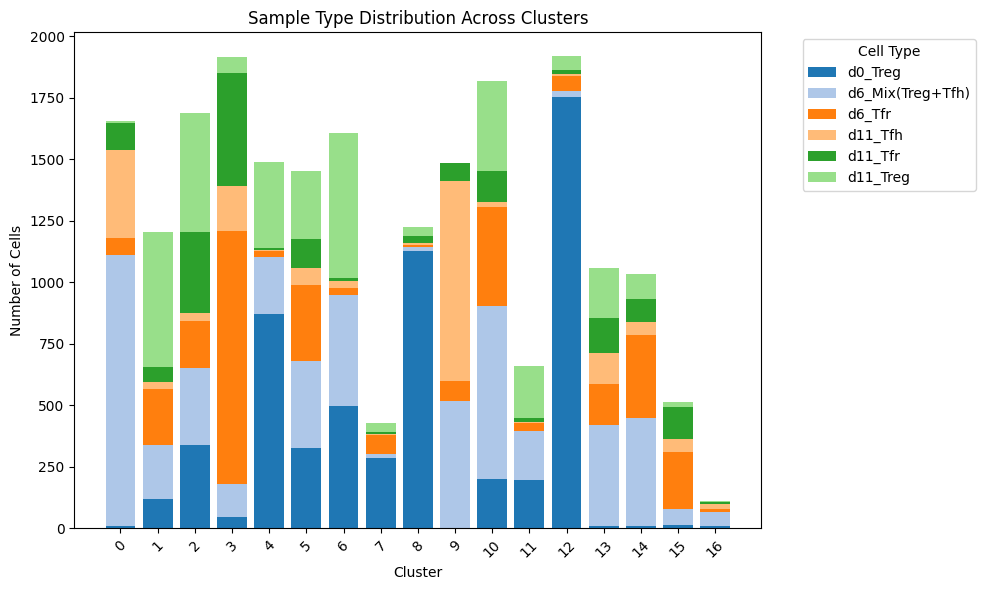

In [9]:
# Step 1: Count cells per cluster and sample
counts_df = (
    adata.obs[['leiden_res_0.9', 'sample_type']]
    .groupby(['leiden_res_0.9', 'sample_type'])
    .size()
    .reset_index(name='count')
)

# Step 2: Pivot to wide format (clusters as rows, cell types as columns)
pivot_df = counts_df.pivot_table(
    index='leiden_res_0.9',
    columns='sample_type',
    values='count',
    fill_value=0
)

# Step 3: Plot stacked bar chart with cell type colors
fig, ax = plt.subplots(figsize=(10, 6))

bottom = pd.Series(0, index=pivot_df.index)
colors = plt.get_cmap('tab20').colors  # You can customize the colormap
cell_types = pivot_df.columns

for i, cell_type in enumerate(cell_types):
    ax.bar(
        pivot_df.index,
        pivot_df[cell_type],
        bottom=bottom,
        label=cell_type,
        color=colors[i % len(colors)]
    )
    bottom += pivot_df[cell_type]

ax.set_ylabel("Number of Cells")
ax.set_xlabel("Cluster")
ax.set_title("Sample Type Distribution Across Clusters")
ax.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()